Research and original work by Dr. Akanksha Maurya, P.H.D.

Replication of research by Syed Ali Haider, M.S.


Code Explanation
The following code cells contain the implementation for training and evaluating a U-Net model for basal cell carcinoma vessel segmentation.

Libraries Import
This cell imports all the necessary libraries for the project, including libraries for image processing, model building, data augmentation, and visualization.

In [ ]:
'''

Abstract

Purpose: Blood vessels called telangiectasia are visible in skin lesions with the aid of
dermoscopy. Telangiectasia are a pivotal identifying feature of basal cell carcinoma.
These vessels appear thready, serpiginous, and may also appear arborizing, that is,
wide vessels branch into successively thinner vessels. Due to these intricacies, their
detection is not an easy task, neither with manual annotation nor with computer-
ized techniques. In this study, we automate the segmentation of telangiectasia in
dermoscopic images with a deep learning U-Net approach.


Methods: We apply a combination of image processing techniques and a deep
learning-based U-Net approach to detect telangiectasia in digital basal cell carcinoma
skin cancer images. We compare loss functions and optimize the performance by using
a combination loss function to manage class imbalance of skin versus vessel pixels.
Results: We establish a baseline method for pixel-based telangiectasia detection in
skin cancer lesion images. An analysis and comparison for human observer variability
in annotation is also presented.

Conclusion: Our approach yields Jaccard score within the variation of human
observers as it addresses a new aspect of the rapidly evolving field of deep learning:
automatic identification of cancer-specific structures. Further application of DL tech-
niques to detect dermoscopic structures and handle noisy labels is warranted.


'''

In [ ]:
import cv2
import numpy as np
import os
from google.colab import files
from google.colab import drive
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.callbacks import LearningRateScheduler
from sklearn.model_selection import train_test_split
import math
from tensorflow.keras.metrics import MeanIoU
from keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import numpy as np
import random
from PIL import Image



Data Extraction
This cell extracts the image and mask data from the provided zip files.

In [ ]:
# # Mount Google Drive to access files (if using Drive)
# drive.mount('/content/drive')

# Alternatively, upload files using Colab's upload feature
#uploaded = files.upload()  # Upload images and masks manually
!unzip /content/drive-download-20250515T155538Z-1-001.zip


# # importing the zipfile module
# from zipfile import ZipFile

# # loading the temp.zip and creating a zip object
# with ZipFile("C:\\Users\\sai mohan pulamolu\\\
#             Desktop\\geeks_dir\\temp\\temp.zip", 'r') as zObject:

#     # Extracting all the members of the zip
#     # into a specific location.
#     zObject.extractall(
#          path="C:\\Users\\sai mohan pulamolu\\Desktop\\geeks_dir\\temp")
# source:https://www.geeksforgeeks.org/unzipping-files-in-python/

Archive:  /content/drive-download-20250515T155538Z-1-001.zip
replace test_masks-20250515T022346Z-1-001.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace trainmasksunet-20250515T022244Z-1-001.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace test_images-20250515T022320Z-1-001.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: m
error:  invalid response [m]
replace test_images-20250515T022320Z-1-001.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace trainimagesunet-20250515T022135Z-1-001.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


File Paths
This cell defines the file paths for the training and testing image and mask datasets.

In [ ]:
testflist=['/content/test_images-20250515T022320Z-1-001.zip',
'/content/test_masks-20250515T022346Z-1-001.zip']

trainflist=["/content/trainimagesunet-20250515T022135Z-1-001.zip","/content/trainmasksunet-20250515T022244Z-1-001.zip"]




Unzipping Training Data
This cell unzips the training image and mask data to the specified path.

In [ ]:
from zipfile import ZipFile

# loading the temp.zip and creating a zip object
for i in trainflist:
  with ZipFile(i, 'r') as zObject:

      # Extracting all the members of the zip
      # into a specific location.
      zObject.extractall(
          path="/content")



Verify Extraction
This cell lists the contents of the '/content' directory to verify that the zip files were extracted correctly.

In [ ]:
!ls -lrt -a /content

total 68060
drwxr-xr-x 4 root root     4096 May 14 13:38 .config
drwxr-xr-x 1 root root     4096 May 14 13:38 sample_data
-rw-r--r-- 1 root root 24867260 May 15 02:21 trainimagesunet-20250515T022135Z-1-001.zip
-rw-r--r-- 1 root root  2986849 May 15 02:22 trainmasksunet-20250515T022244Z-1-001.zip
-rw-r--r-- 1 root root  6228342 May 15 02:23 test_images-20250515T022320Z-1-001.zip
-rw-r--r-- 1 root root   740068 May 15 02:23 test_masks-20250515T022346Z-1-001.zip
drwxr-xr-x 1 root root     4096 May 15 21:17 ..
-rw-r--r-- 1 root root 34829298 May 15 21:28 drive-download-20250515T155538Z-1-001.zip
drwxr-xr-x 2 root root     4096 May 15 21:34 trainimagesunet
drwxr-xr-x 1 root root     4096 May 15 21:34 .
drwxr-xr-x 2 root root     4096 May 15 21:34 trainmasksunet


Load and Preprocess Images
This cell defines a function to load, preprocess, and augment the images and masks. It then applies this function to the training data and normalizes the pixel values.

In [ ]:


def load_and_preprocess_images(image_dir, mask_dir, target_size=(256, 256), num_augmented_images=800, batch_size=1):
    # Define the same seed to ensure same transformation on image and mask
    seed = 42

    # Image data generator
    image_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Mask data generator — no interpolation to preserve binary values
    mask_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    image_filenames = [f for f in os.listdir(image_dir)
                       if f.lower().endswith(('.png', '.jpg', '.jpeg')) and
                          os.path.exists(os.path.join(mask_dir, f))]

    print(f"Found {len(image_filenames)} matched image-mask pairs.")

    augmented_images = []
    augmented_masks = []

    while len(augmented_images) < num_augmented_images:
        filename = random.choice(image_filenames)

        # Load and resize image
        img_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir, filename)

        img = load_img(img_path, target_size=target_size)
        mask = load_img(mask_path, target_size=target_size, color_mode="grayscale")

        x_img = img_to_array(img)
        x_mask = img_to_array(mask)

        # Expand dimensions to make shape (1, h, w, c)
        x_img = np.expand_dims(x_img, axis=0)
        x_mask = np.expand_dims(x_mask, axis=0)


        # Create generators
        img_gen = image_datagen.flow(x_img, batch_size=batch_size, seed=seed)
        mask_gen = mask_datagen.flow(x_mask, batch_size=batch_size, seed=seed)

        # Generate one pair
        aug_img = next(img_gen)[0].astype(np.uint8)
        aug_mask = next(mask_gen)[0]

        # Ensure binary mask (e.g., values exactly 0 or 255, or 0 and 1)
        aug_mask = (aug_mask > 127).astype(np.uint8) * 255

        augmented_images.append(aug_img)
        augmented_masks.append(aug_mask)

    augmented_images = np.array(augmented_images, dtype=np.uint8)
    augmented_masks = np.array(augmented_masks, dtype=np.uint8)

    print(f"Generated {len(augmented_images)} image-mask pairs.")

    return augmented_images, augmented_masks

# The paths below should work for your images and masks if you downloaded and uploaded the folders to your drive
# image_dir = '/content/drive/MyDrive/trainimagesunet'
# mask_dir = '/content/drive/MyDrive/trainmasksunet'
image_dir= '/content/trainimagesunet'
mask_dir = '/content/trainmasksunet'
# Load and preprocess images and masks
images, masks = load_and_preprocess_images(image_dir, mask_dir)
images = np.array(images) / 255.0
masks = (masks > 127).astype(np.float32)

# Check shape of loaded images and masks
print(images.shape, masks.shape)

Found 80 matched image-mask pairs.
Generated 800 image-mask pairs.
(800, 256, 256, 3) (800, 256, 256, 1)


Check Mask Values
This cell displays the unique values in the processed masks to ensure they are binary (0 and 1).

In [ ]:
np.unique(masks)

array([0., 1.], dtype=float32)

Filter Size Calculation
This cell calculates the final filter size for the U-Net model based on the initial filter size and the number of downsampling steps.

In [ ]:
f=64
f *= 2
f *= 2
f *= 2
f *= 2
print(f)

1024


Custom U-Net Model
This cell defines the custom U-Net model architecture, following the structure described in the U-Net paper but with double the specified filter sizes. It then compiles the model with the Adam optimizer and Binary Crossentropy loss.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Input, Conv2DTranspose
from tensorflow.keras.models import Model

def custom_unet(input_shape=(256, 256, 3)):
    inputs = Input(input_shape)

    f=64
    # Encoder (build from scratch)
    e1 = Conv2D( f, 3, activation='relu', padding='same')(inputs)
    e1 = Conv2D( f, 3, activation='relu', padding='same')(e1)
    p1 = MaxPooling2D()(e1)
    f *= 2
    # e2
    e2 = Conv2D( f, 3, activation='relu', padding='same')(p1)
    e2 = Conv2D( f, 3, activation='relu', padding='same')(e2)
    p2 = MaxPooling2D()(e2)
    #
    #
    f *= 2
    # e3
    e3 = Conv2D( f, 3, activation='relu', padding='same')(p2)
    e3 = Conv2D( f, 3, activation='relu', padding='same')(e3)
    p3 = MaxPooling2D()(e3)
    #

    # e4
    f *= 2
    e4 = Conv2D( f, 3, activation='relu', padding='same')(p3)
    e4 = Conv2D( f, 3, activation='relu', padding='same')(e4)
    p4 = MaxPooling2D()(e4)
    #
    #

    #bottleneck
    # e5
    f *=2
    e5 = Conv2D( f, 3, activation='relu', padding='same')(p4)
    e5 = Conv2D( f, 3, activation='relu', padding='same')(e5)
    # no maxpooling

    f //=2

    # Decoder (upsampling and concatenation with skip connections)
    d1 = Conv2DTranspose(f,2, strides=(2, 2), padding='same')(e5)
    d1 = Concatenate()([d1, e4])
    # d1 = Conv2D(512, 3, activation='relu', padding='same')(d1)
    # d1 = Conv2D(512, 3, activation='relu', padding='same')(d1)
    d1 = Conv2D(f, 3, activation='relu', padding='same')(d1)
    d1 = Conv2D(f, 3, activation='relu', padding='same')(d1)

    f //=2
    # d2
    d2 = Conv2DTranspose(f,2, strides=(2, 2), padding='same')(d1)
    d2 = Concatenate()([d2, e3])
    # d1 = Conv2D(512//2, 3, activation='relu', padding='same')(d1)
    # d1 = Conv2D(512//2, 3, activation='relu', padding='same')(d1)
    d2 = Conv2D(f, 3, activation='relu', padding='same')(d2)
    d2 = Conv2D(f, 3, activation='relu', padding='same')(d2)
    #
    #
    #

    # d3
    f //=2

    d3 = Conv2DTranspose(f,2, strides=(2, 2), padding='same')(d2)
    d3 = Concatenate()([d3, e2])
    # d1 = Conv2D(512//2, 3, activation='relu', padding='same')(d1)
    # d1 = Conv2D(512//2, 3, activation='relu', padding='same')(d1)
    d3 = Conv2D(f, 3, activation='relu', padding='same')(d3)
    d3 = Conv2D(f, 3, activation='relu', padding='same')(d3)


    # d4

    f//=2
    d4 = Conv2DTranspose(f,2, strides=(2, 2), padding='same')(d3)
    d4 = Concatenate()([d4, e1])
    d4 = Conv2D(f, 3, activation='relu', padding='same')(d4)
    d4 = Conv2D(f, 3, activation='relu', padding='same')(d4)
    #
    #
    #
    #

    # Final output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(d4)

    # Build and return model
    model = Model(inputs =[inputs], outputs=[outputs])
    return model

model = custom_unet()

optimizer = Adam(learning_rate=0.01)
model.compile(optimizer= optimizer, loss=BinaryCrossentropy(), metrics=[MeanIoU(num_classes=2)])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 16, 16,    │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 32, 32,    │  2,097,664 │ conv2d_9[0][0]    │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ conv2d_transpose

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

Model Training
This cell trains the U-Net model using the preprocessed training data. It includes callbacks for early stopping, model checkpointing, and learning rate scheduling.

In [ ]:
# Fit model

X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.10, random_state=42)

#lrate = LearningRateScheduler(step_decay)
def step_decay(epoch):
    initial_lrate = 0.0001
    drop = 0.1
    #initial_lrate = 0.01
    #drop = 0.01
    epochs_drop = 30
    lrate = initial_lrate * math.pow(drop,
           math.floor((1+epoch)/epochs_drop))
    return lrate

#from keras import backend as K
epochs = 50
lrate = LearningRateScheduler(step_decay)
#callbacks_list=[lr, model_ckpt]
earlystopper = EarlyStopping(monitor = 'val_loss',min_delta=1e-4,patience=10, verbose=1) # you can change the patience value to a little lower.
checkpointer = ModelCheckpoint('Unet.h5', monitor = 'val_loss',verbose=1, save_best_only=True)
callbacks_list = [earlystopper, checkpointer,lrate]
results = model.fit(X_train, y_train, validation_data=(X_val,y_val), batch_size=8, epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(8, 256, 256, 3))
  warnings.warn(msg)


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - loss: 0.5413 - mean_io_u: 0.4553
Epoch 1: val_loss improved from inf to 0.28236, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 107s 643ms/step - loss: 0.5399 - mean_io_u: 0.4553 - val_loss: 0.2824 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 2/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 0.2764 - mean_io_u: 0.4553
Epoch 2: val_loss improved from 0.28236 to 0.26871, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 479ms/step - loss: 0.2764 - mean_io_u: 0.4553 - val_loss: 0.2687 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 3/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - loss: 0.2682 - mean_io_u: 0.4553
Epoch 3: val_loss improved from 0.26871 to 0.26425, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 474ms/step - loss: 0.2682 - mean_io_u: 0.4553 - val_loss: 0.2642 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 4/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step - loss: 0.2646 - mean_io_u: 0.4549
Epoch 4: val_loss improved from 0.26425 to 0.25672, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 477ms/step - loss: 0.2646 - mean_io_u: 0.4549 - val_loss: 0.2567 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 5/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - loss: 0.2517 - mean_io_u: 0.4552
Epoch 5: val_loss improved from 0.25672 to 0.22940, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 476ms/step - loss: 0.2516 - mean_io_u: 0.4552 - val_loss: 0.2294 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 6/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - loss: 0.2181 - mean_io_u: 0.4556
Epoch 6: val_loss improved from 0.22940 to 0.19026, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 477ms/step - loss: 0.2181 - mean_io_u: 0.4556 - val_loss: 0.1903 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 7/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step - loss: 0.1835 - mean_io_u: 0.4550
Epoch 7: val_loss improved from 0.19026 to 0.15521, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 479ms/step - loss: 0.1835 - mean_io_u: 0.4550 - val_loss: 0.1552 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 8/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step - loss: 0.1492 - mean_io_u: 0.4555
Epoch 8: val_loss improved from 0.15521 to 0.13902, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 479ms/step - loss: 0.1491 - mean_io_u: 0.4555 - val_loss: 0.1390 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 9/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 0.1361 - mean_io_u: 0.4553
Epoch 9: val_loss improved from 0.13902 to 0.12906, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 480ms/step - loss: 0.1361 - mean_io_u: 0.4553 - val_loss: 0.1291 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 10/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.1282 - mean_io_u: 0.4557
Epoch 10: val_loss improved from 0.12906 to 0.12759, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.1282 - mean_io_u: 0.4557 - val_loss: 0.1276 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 11/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - loss: 0.1246 - mean_io_u: 0.4549
Epoch 11: val_loss improved from 0.12759 to 0.12066, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 481ms/step - loss: 0.1246 - mean_io_u: 0.4549 - val_loss: 0.1207 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 12/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - loss: 0.1176 - mean_io_u: 0.4551
Epoch 12: val_loss improved from 0.12066 to 0.11622, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 481ms/step - loss: 0.1176 - mean_io_u: 0.4551 - val_loss: 0.1162 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 13/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.1147 - mean_io_u: 0.4551
Epoch 13: val_loss improved from 0.11622 to 0.11088, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 481ms/step - loss: 0.1147 - mean_io_u: 0.4551 - val_loss: 0.1109 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 14/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.1076 - mean_io_u: 0.4552
Epoch 14: val_loss improved from 0.11088 to 0.10567, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.1076 - mean_io_u: 0.4552 - val_loss: 0.1057 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 15/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.1038 - mean_io_u: 0.4548
Epoch 15: val_loss did not improve from 0.10567
90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 473ms/step - loss: 0.1038 - mean_io_u: 0.4548 - val_loss: 0.1084 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 16/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.1021 - mean_io_u: 0.4553
Epoch 16: val_loss improved from 0.10567 to 0.09769, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.1020 - mean_io_u: 0.4553 - val_loss: 0.0977 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 17/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0936 - mean_io_u: 0.4553
Epoch 17: val_loss improved from 0.09769 to 0.09211, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 484ms/step - loss: 0.0936 - mean_io_u: 0.4553 - val_loss: 0.0921 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 18/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0879 - mean_io_u: 0.4551
Epoch 18: val_loss did not improve from 0.09211
90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 474ms/step - loss: 0.0879 - mean_io_u: 0.4551 - val_loss: 0.0966 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 19/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0867 - mean_io_u: 0.4553
Epoch 19: val_loss improved from 0.09211 to 0.07740, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0866 - mean_io_u: 0.4553 - val_loss: 0.0774 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 20/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0755 - mean_io_u: 0.4551
Epoch 20: val_loss improved from 0.07740 to 0.07252, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 481ms/step - loss: 0.0755 - mean_io_u: 0.4551 - val_loss: 0.0725 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 21/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 0.0694 - mean_io_u: 0.4551
Epoch 21: val_loss improved from 0.07252 to 0.06622, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 485ms/step - loss: 0.0694 - mean_io_u: 0.4551 - val_loss: 0.0662 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 22/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0615 - mean_io_u: 0.4553
Epoch 22: val_loss improved from 0.06622 to 0.05962, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0615 - mean_io_u: 0.4553 - val_loss: 0.0596 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 23/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0566 - mean_io_u: 0.4555
Epoch 23: val_loss improved from 0.05962 to 0.05201, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0566 - mean_io_u: 0.4555 - val_loss: 0.0520 - val_mean_io_u: 0.4554 - learning_rate: 1.0000e-04
Epoch 24/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0490 - mean_io_u: 0.4553
Epoch 24: val_loss improved from 0.05201 to 0.04811, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0490 - mean_io_u: 0.4553 - val_loss: 0.0481 - val_mean_io_u: 0.4555 - learning_rate: 1.0000e-04
Epoch 25/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0476 - mean_io_u: 0.4556
Epoch 25: val_loss improved from 0.04811 to 0.04287, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0476 - mean_io_u: 0.4556 - val_loss: 0.0429 - val_mean_io_u: 0.4555 - learning_rate: 1.0000e-04
Epoch 26/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0388 - mean_io_u: 0.4558
Epoch 26: val_loss improved from 0.04287 to 0.03978, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0388 - mean_io_u: 0.4558 - val_loss: 0.0398 - val_mean_io_u: 0.4557 - learning_rate: 1.0000e-04
Epoch 27/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0356 - mean_io_u: 0.4561
Epoch 27: val_loss improved from 0.03978 to 0.03395, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 485ms/step - loss: 0.0356 - mean_io_u: 0.4561 - val_loss: 0.0339 - val_mean_io_u: 0.4570 - learning_rate: 1.0000e-04
Epoch 28/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 0.0318 - mean_io_u: 0.4576
Epoch 28: val_loss improved from 0.03395 to 0.03329, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 486ms/step - loss: 0.0318 - mean_io_u: 0.4576 - val_loss: 0.0333 - val_mean_io_u: 0.4566 - learning_rate: 1.0000e-04
Epoch 29/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0332 - mean_io_u: 0.4569
Epoch 29: val_loss improved from 0.03329 to 0.02887, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0332 - mean_io_u: 0.4569 - val_loss: 0.0289 - val_mean_io_u: 0.4601 - learning_rate: 1.0000e-04
Epoch 30/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0229 - mean_io_u: 0.4626
Epoch 30: val_loss improved from 0.02887 to 0.02233, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0228 - mean_io_u: 0.4626 - val_loss: 0.0223 - val_mean_io_u: 0.4677 - learning_rate: 1.0000e-05
Epoch 31/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0192 - mean_io_u: 0.4718
Epoch 31: val_loss improved from 0.02233 to 0.02106, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 484ms/step - loss: 0.0192 - mean_io_u: 0.4718 - val_loss: 0.0211 - val_mean_io_u: 0.4754 - learning_rate: 1.0000e-05
Epoch 32/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0178 - mean_io_u: 0.4805
Epoch 32: val_loss improved from 0.02106 to 0.02001, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0178 - mean_io_u: 0.4805 - val_loss: 0.0200 - val_mean_io_u: 0.4835 - learning_rate: 1.0000e-05
Epoch 33/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0168 - mean_io_u: 0.4897
Epoch 33: val_loss improved from 0.02001 to 0.01912, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0168 - mean_io_u: 0.4898 - val_loss: 0.0191 - val_mean_io_u: 0.4912 - learning_rate: 1.0000e-05
Epoch 34/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0163 - mean_io_u: 0.4975
Epoch 34: val_loss improved from 0.01912 to 0.01833, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 484ms/step - loss: 0.0163 - mean_io_u: 0.4976 - val_loss: 0.0183 - val_mean_io_u: 0.5003 - learning_rate: 1.0000e-05
Epoch 35/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0156 - mean_io_u: 0.5085
Epoch 35: val_loss improved from 0.01833 to 0.01752, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 485ms/step - loss: 0.0156 - mean_io_u: 0.5085 - val_loss: 0.0175 - val_mean_io_u: 0.5096 - learning_rate: 1.0000e-05
Epoch 36/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0146 - mean_io_u: 0.5200
Epoch 36: val_loss improved from 0.01752 to 0.01671, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 485ms/step - loss: 0.0146 - mean_io_u: 0.5201 - val_loss: 0.0167 - val_mean_io_u: 0.5197 - learning_rate: 1.0000e-05
Epoch 37/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0143 - mean_io_u: 0.5286
Epoch 37: val_loss improved from 0.01671 to 0.01594, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0143 - mean_io_u: 0.5286 - val_loss: 0.0159 - val_mean_io_u: 0.5303 - learning_rate: 1.0000e-05
Epoch 38/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0137 - mean_io_u: 0.5387
Epoch 38: val_loss improved from 0.01594 to 0.01524, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0137 - mean_io_u: 0.5387 - val_loss: 0.0152 - val_mean_io_u: 0.5409 - learning_rate: 1.0000e-05
Epoch 39/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0126 - mean_io_u: 0.5505
Epoch 39: val_loss improved from 0.01524 to 0.01444, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0126 - mean_io_u: 0.5505 - val_loss: 0.0144 - val_mean_io_u: 0.5511 - learning_rate: 1.0000e-05
Epoch 40/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0123 - mean_io_u: 0.5611
Epoch 40: val_loss improved from 0.01444 to 0.01375, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0123 - mean_io_u: 0.5612 - val_loss: 0.0137 - val_mean_io_u: 0.5635 - learning_rate: 1.0000e-05
Epoch 41/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 0.0110 - mean_io_u: 0.5779
Epoch 41: val_loss improved from 0.01375 to 0.01320, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 44s 484ms/step - loss: 0.0110 - mean_io_u: 0.5779 - val_loss: 0.0132 - val_mean_io_u: 0.5737 - learning_rate: 1.0000e-05
Epoch 42/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0107 - mean_io_u: 0.5850
Epoch 42: val_loss improved from 0.01320 to 0.01249, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0107 - mean_io_u: 0.5851 - val_loss: 0.0125 - val_mean_io_u: 0.5847 - learning_rate: 1.0000e-05
Epoch 43/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.0102 - mean_io_u: 0.5967
Epoch 43: val_loss improved from 0.01249 to 0.01203, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0102 - mean_io_u: 0.5967 - val_loss: 0.0120 - val_mean_io_u: 0.5931 - learning_rate: 1.0000e-05
Epoch 44/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.0096 - mean_io_u: 0.6056
Epoch 44: val_loss improved from 0.01203 to 0.01143, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0096 - mean_io_u: 0.6057 - val_loss: 0.0114 - val_mean_io_u: 0.6047 - learning_rate: 1.0000e-05
Epoch 45/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0098 - mean_io_u: 0.6142
Epoch 45: val_loss improved from 0.01143 to 0.01139, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0098 - mean_io_u: 0.6142 - val_loss: 0.0114 - val_mean_io_u: 0.6070 - learning_rate: 1.0000e-05
Epoch 46/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.0096 - mean_io_u: 0.6170
Epoch 46: val_loss improved from 0.01139 to 0.01044, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0096 - mean_io_u: 0.6170 - val_loss: 0.0104 - val_mean_io_u: 0.6182 - learning_rate: 1.0000e-05
Epoch 47/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.0083 - mean_io_u: 0.6295
Epoch 47: val_loss improved from 0.01044 to 0.00993, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0083 - mean_io_u: 0.6296 - val_loss: 0.0099 - val_mean_io_u: 0.6276 - learning_rate: 1.0000e-05
Epoch 48/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - loss: 0.0077 - mean_io_u: 0.6415
Epoch 48: val_loss improved from 0.00993 to 0.00948, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 482ms/step - loss: 0.0077 - mean_io_u: 0.6415 - val_loss: 0.0095 - val_mean_io_u: 0.6378 - learning_rate: 1.0000e-05
Epoch 49/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0077 - mean_io_u: 0.6501
Epoch 49: val_loss did not improve from 0.00948
90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 473ms/step - loss: 0.0077 - mean_io_u: 0.6501 - val_loss: 0.0098 - val_mean_io_u: 0.6444 - learning_rate: 1.0000e-05
Epoch 50/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 0.0073 - mean_io_u: 0.6555
Epoch 50: val_loss improved from 0.00948 to 0.00900, saving model to Unet.h5


90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 483ms/step - loss: 0.0073 - mean_io_u: 0.6555 - val_loss: 0.0090 - val_mean_io_u: 0.6504 - learning_rate: 1.0000e-05


Plot Training History
This cell plots the training and validation loss over the epochs to visualize the model's performance during training.

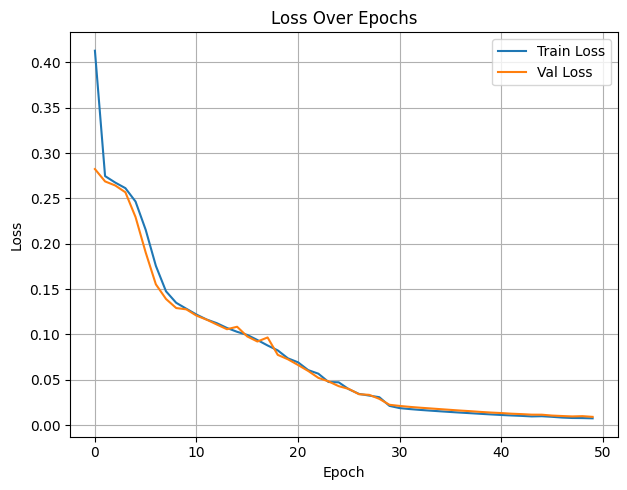

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Loss
    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Accuracy if available
    if 'accuracy' in history.history:
        plt.subplot(1, 2, 2)
        plt.plot(history.history['accuracy'], label='Train Accuracy')
        plt.plot(history.history['val_accuracy'], label='Val Accuracy')
        plt.title('Accuracy Over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(results)

Unzipping Test Data
This cell unzips the test image and mask data to the specified path.

In [ ]:
from zipfile import ZipFile

# loading the temp.zip and creating a zip object
for i in testflist:
  with ZipFile(i, 'r') as zObject:

      # Extracting all the members of the zip
      # into a specific location.
      zObject.extractall(
          path="/content")

Load and Preprocess Test Images
This cell loads and preprocesses the test images and masks using the same function as for the training data.

In [ ]:
# # The paths below should work for your images and masks if you downloaded and uploaded the folders to your drive
test_image_dir = '/content/test_images'
test_mask_dir = '/content/test_masks'

# Load and preprocess images and masks
test_images, test_masks = load_and_preprocess_images(test_image_dir, test_mask_dir)

# Check shape of loaded images and masks
print(test_images.shape, test_masks.shape)
test_images = np.array(test_images) / 255.0
test_masks = (test_masks > 127).astype(np.float32)

Found 20 matched image-mask pairs.
Generated 800 image-mask pairs.
(800, 256, 256, 3) (800, 256, 256, 1)


Visualize Prediction (Single Image)
This cell visualizes the original image, ground truth mask, and predicted mask for a single test image.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


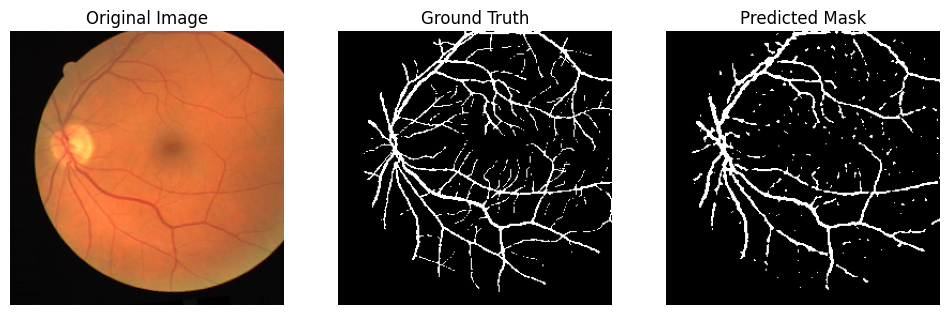

In [ ]:
import matplotlib.pyplot as plt

def visualize_prediction(image, mask, pred_mask):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(image.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Ground Truth')
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Predicted Mask')
    plt.imshow(pred_mask.squeeze(), cmap='gray')
    plt.axis('off')

    plt.show()

# Example usage:
i = 0
sample_image = test_images[i:i+1]
prediction = model.predict(sample_image)[0]
prediction = (prediction > 0.5).astype(np.uint8)
visualize_prediction(test_images[i], test_masks[i], prediction)

Visualize Predictions (Multiple Images)
This cell iterates through a range of test images and visualizes the original image, ground truth mask, and predicted mask for each.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


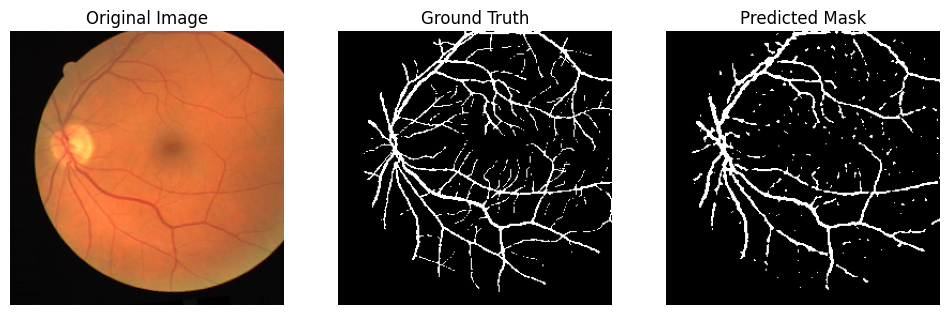

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


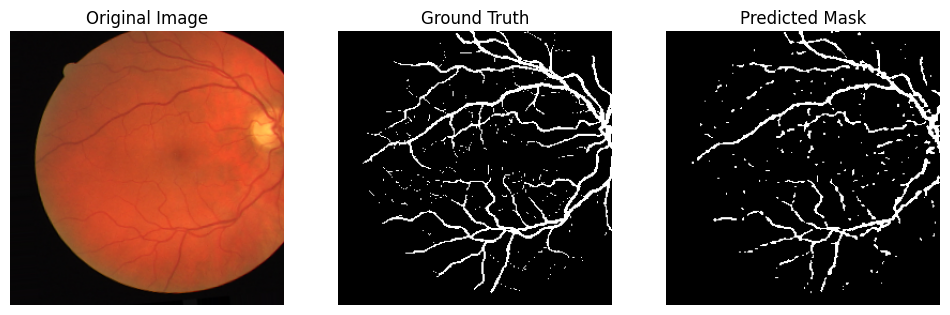

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


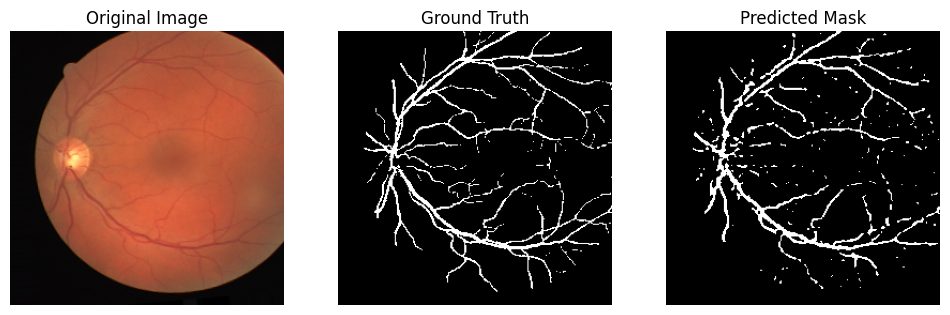

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


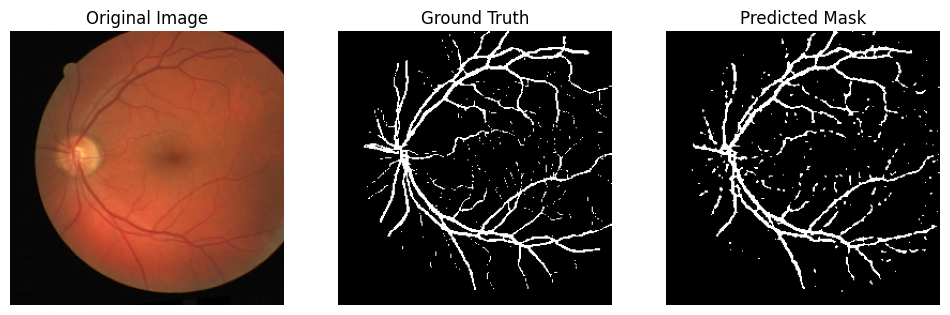

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


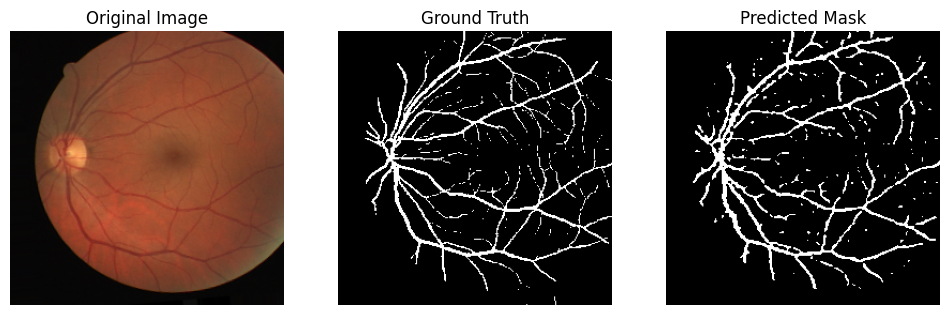

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


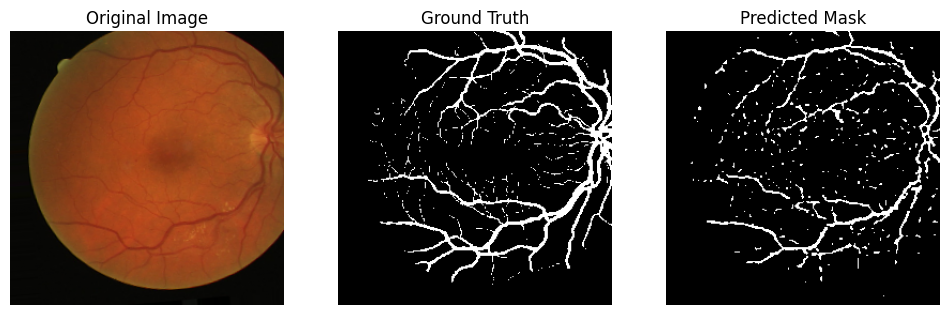

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


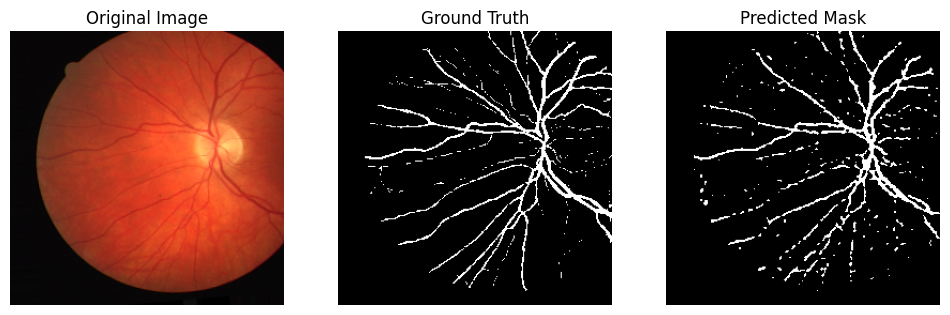

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


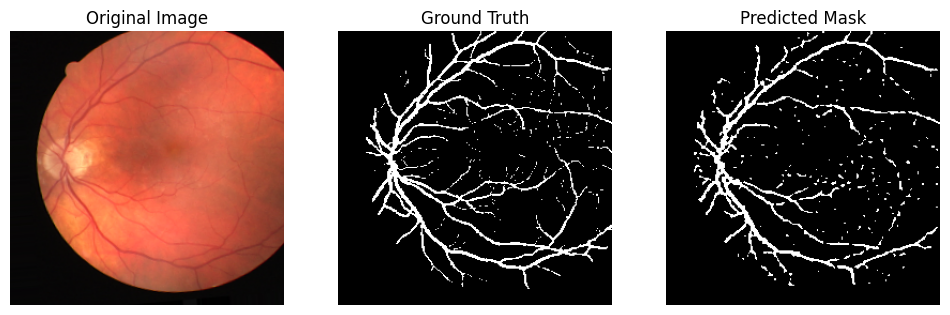

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


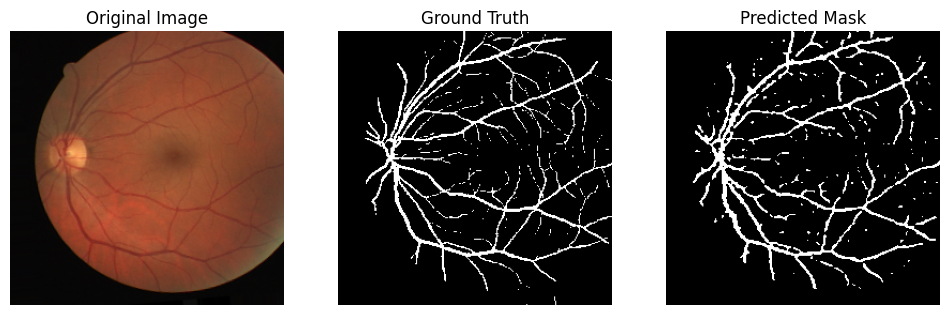

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


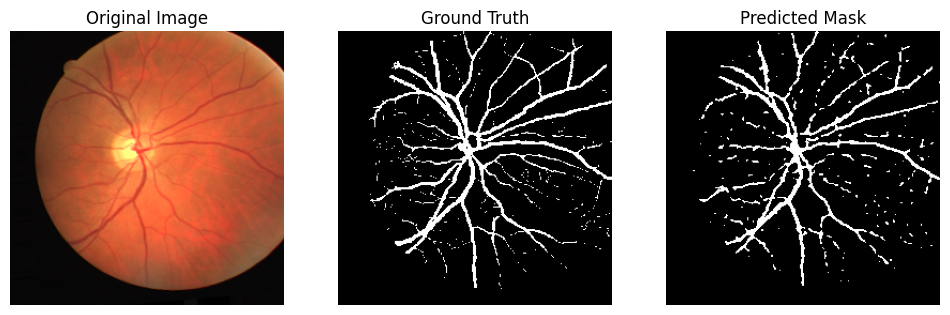

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


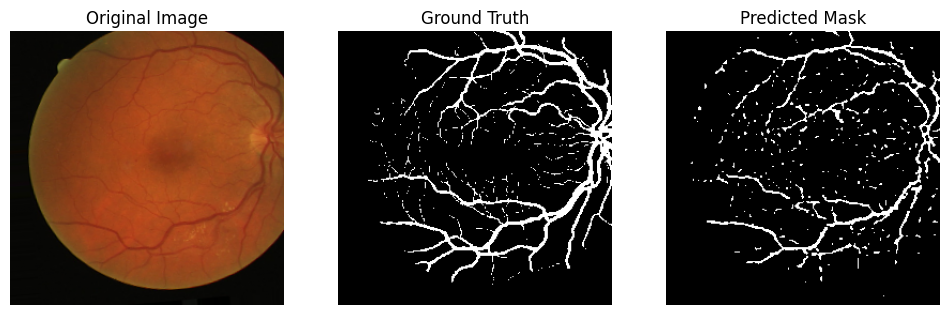

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


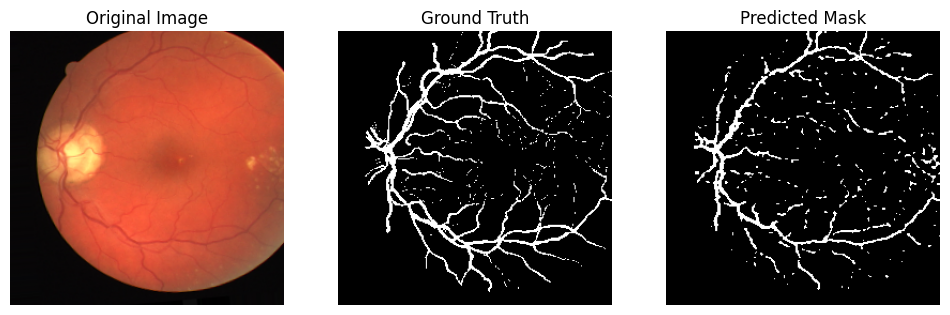

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


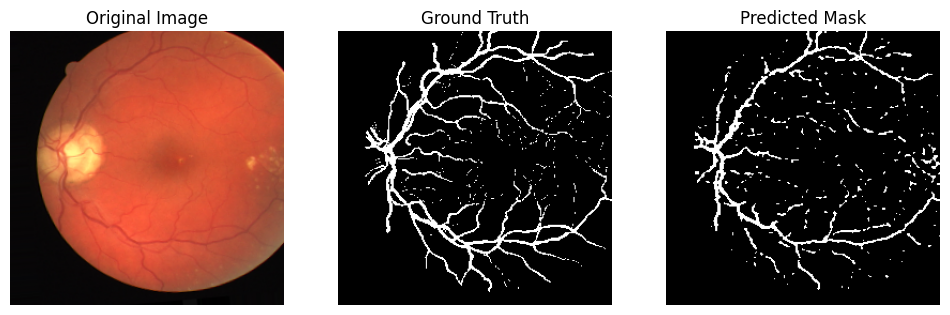

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


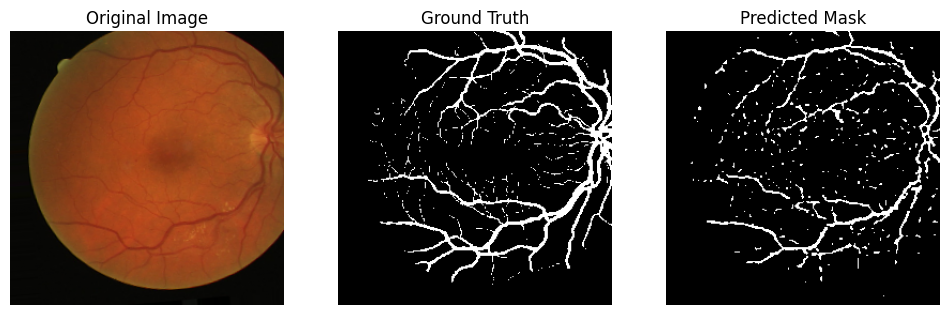

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


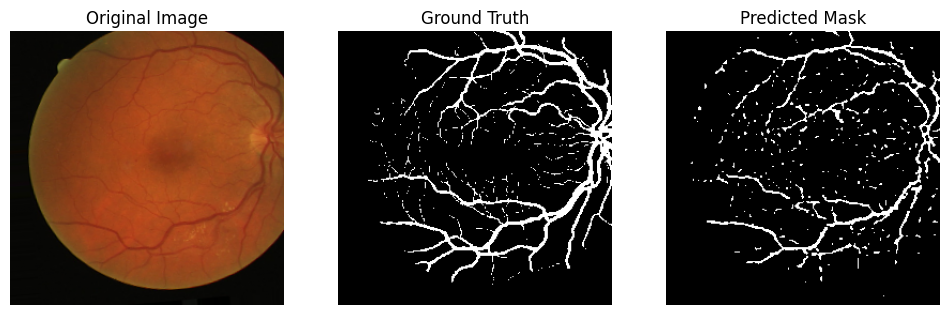

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


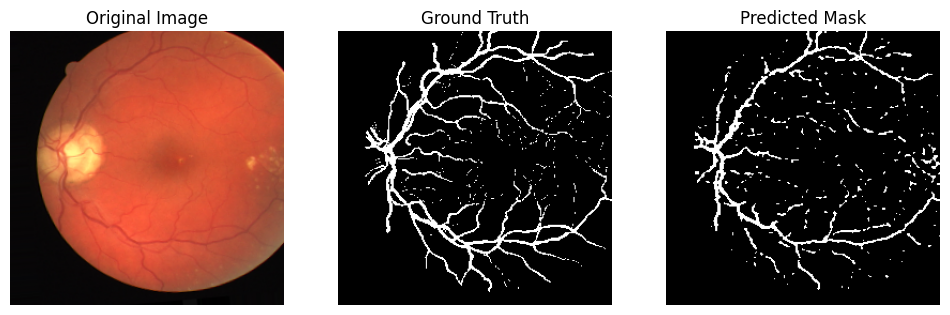

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


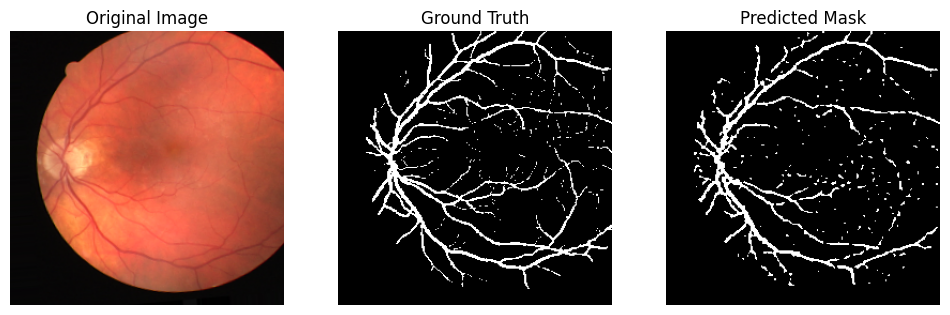

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


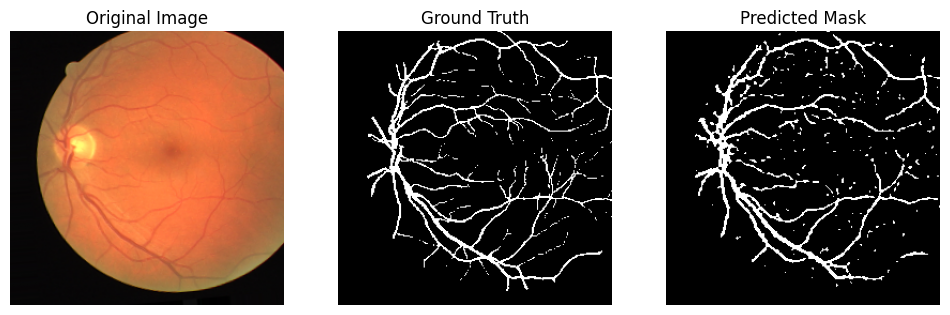

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


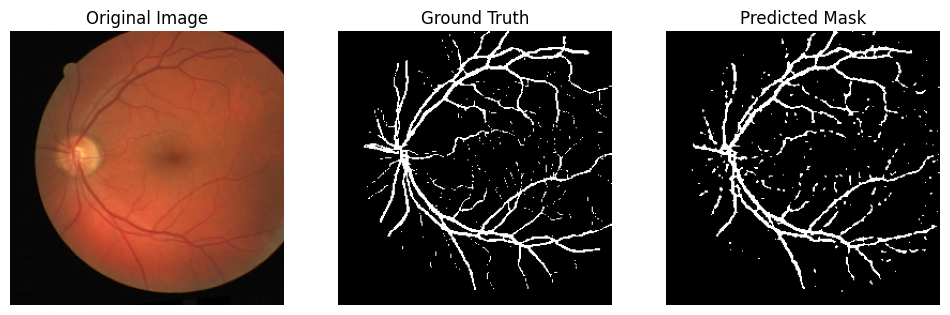

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


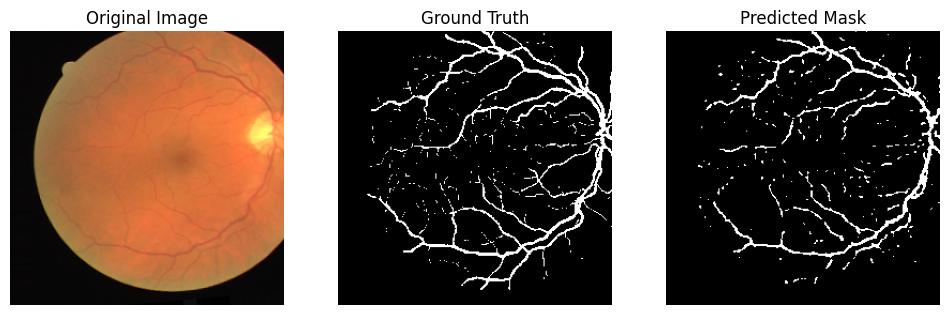

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


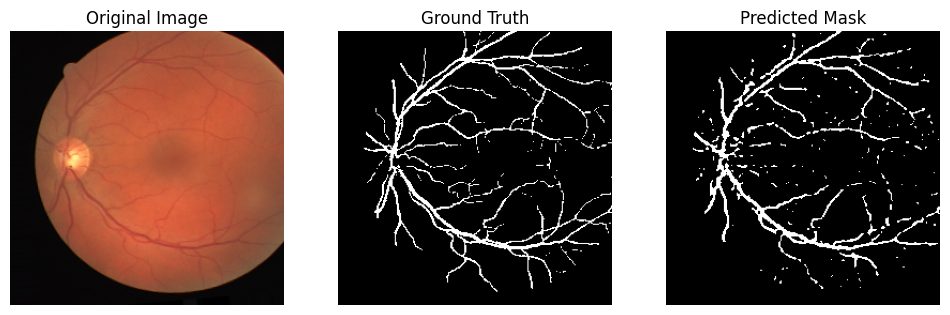

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


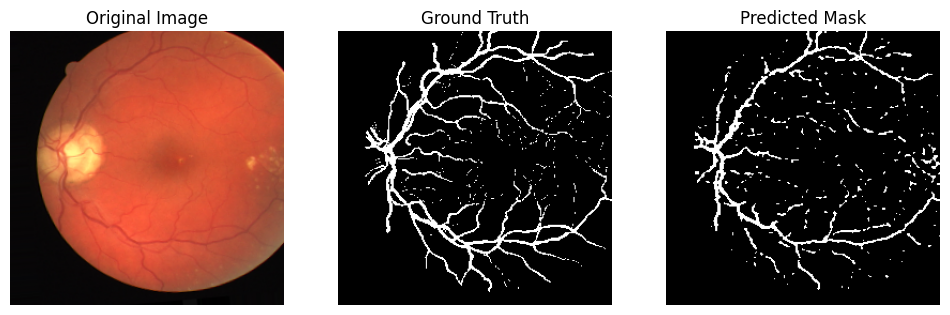

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


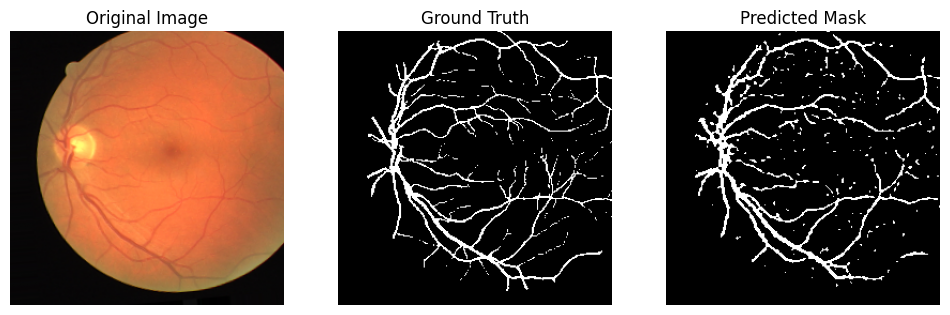

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


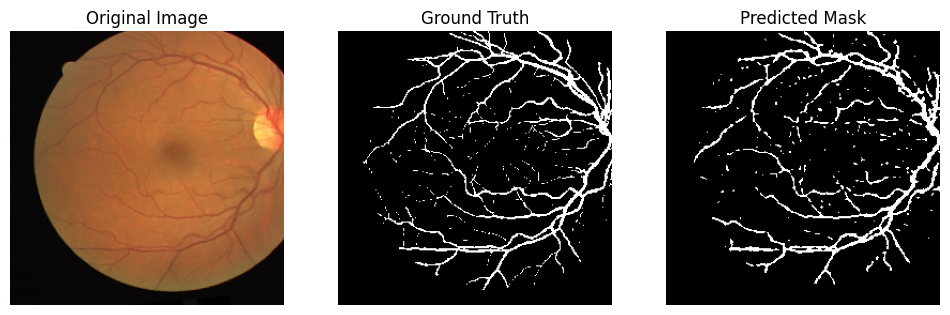

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


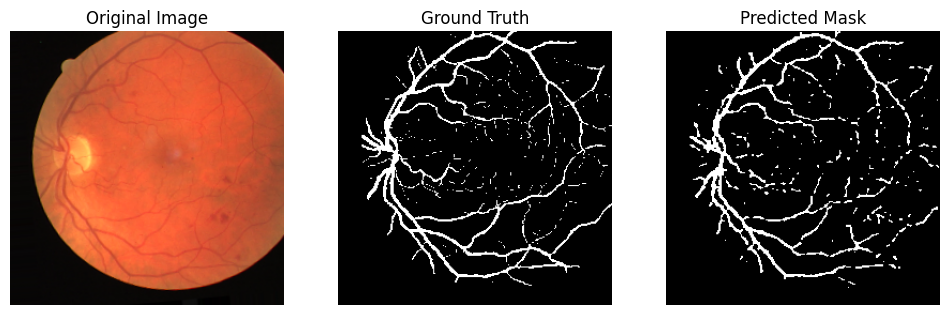

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


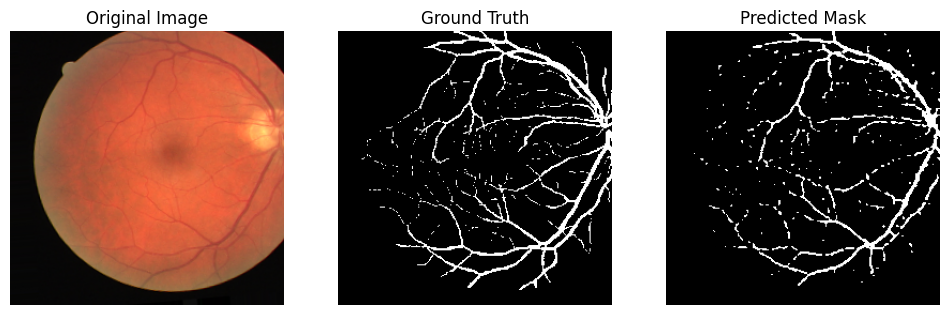

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


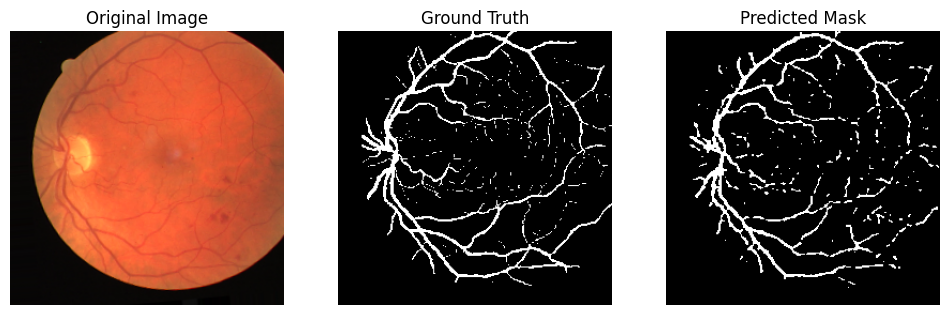

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


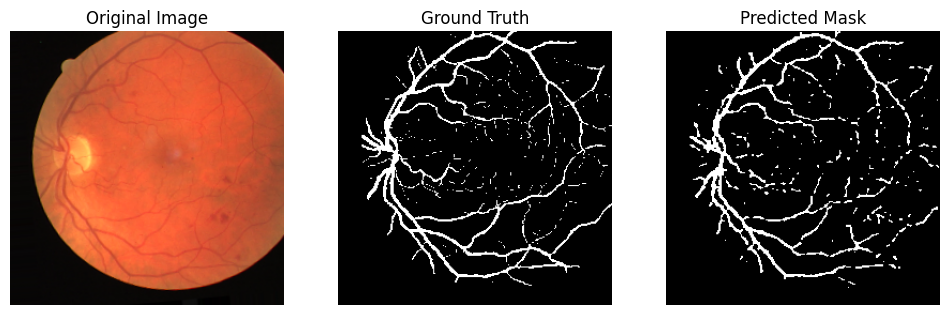

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


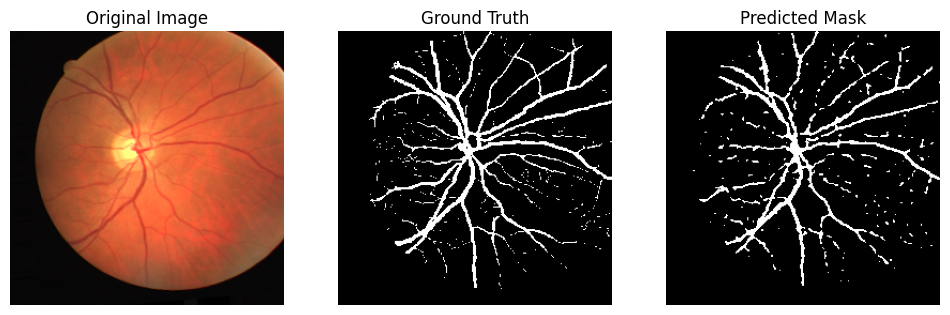

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


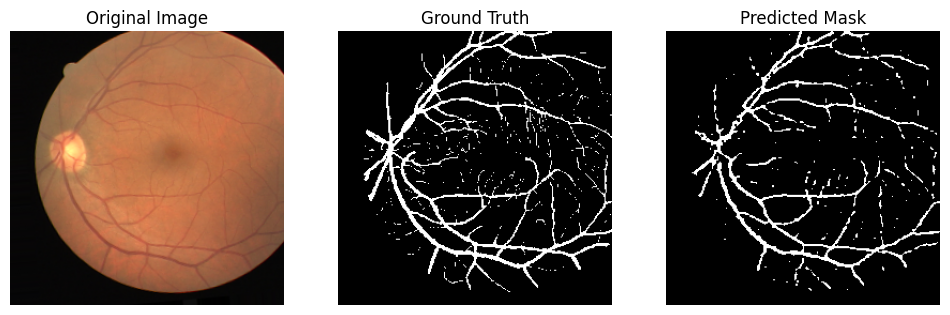

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


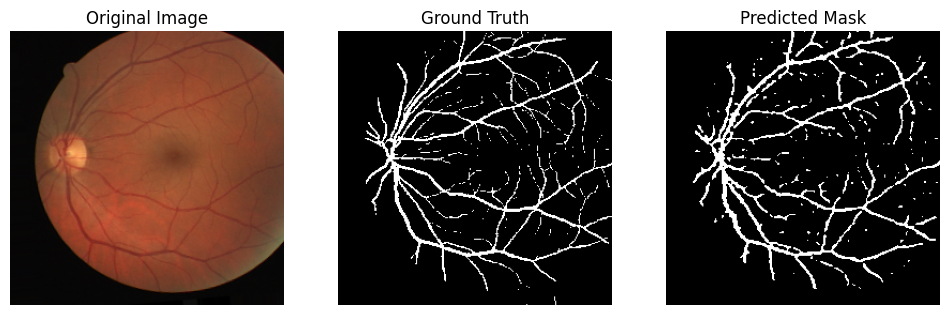

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


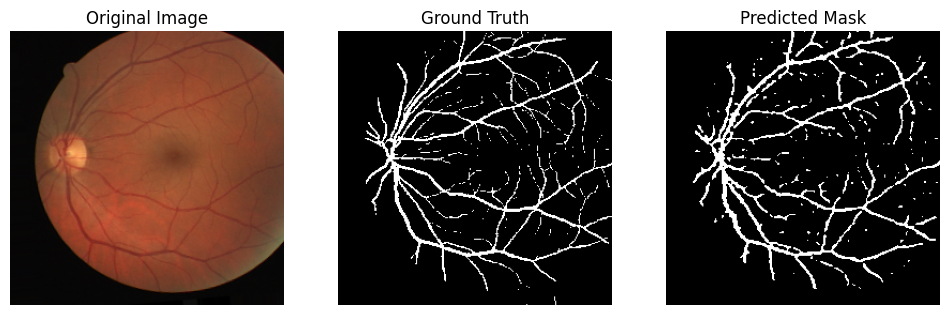

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


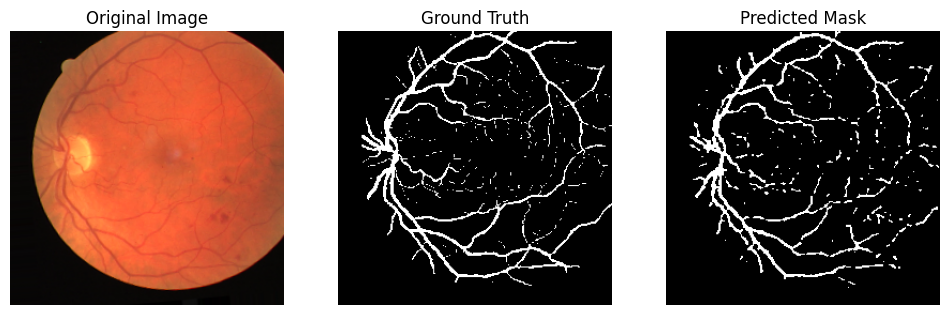

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


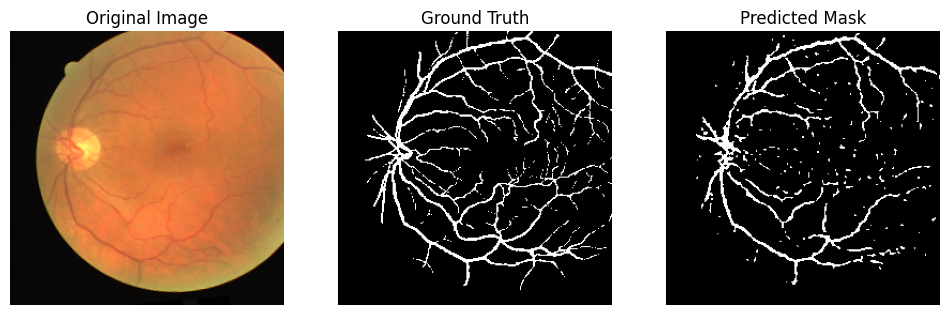

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


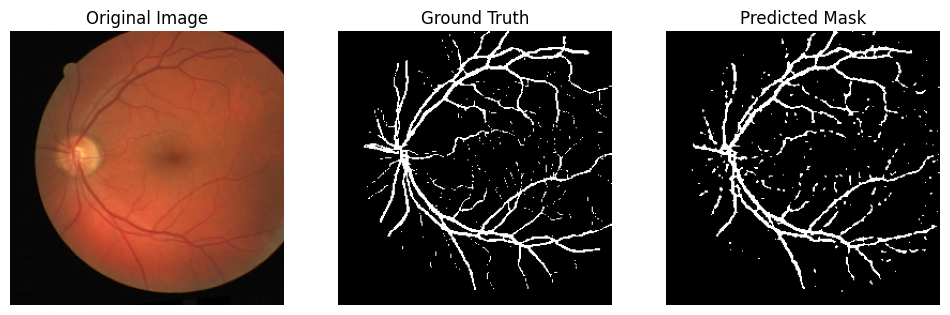

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


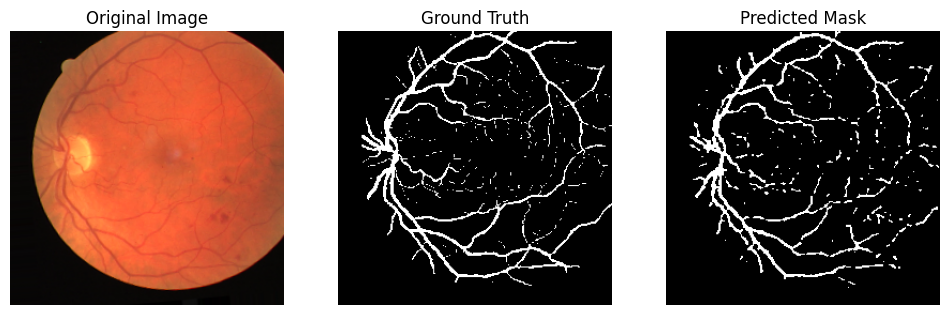

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


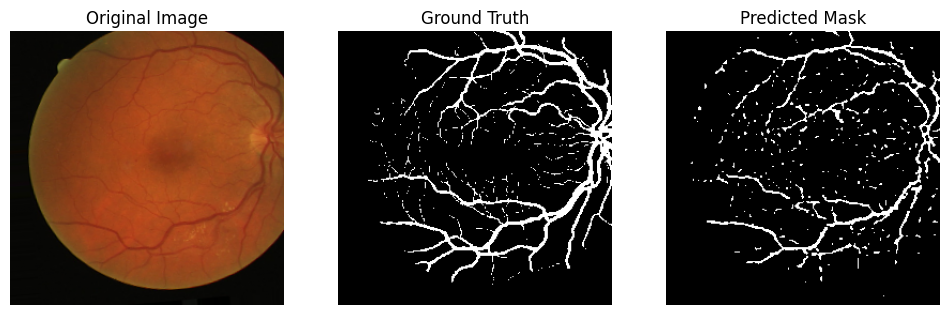

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


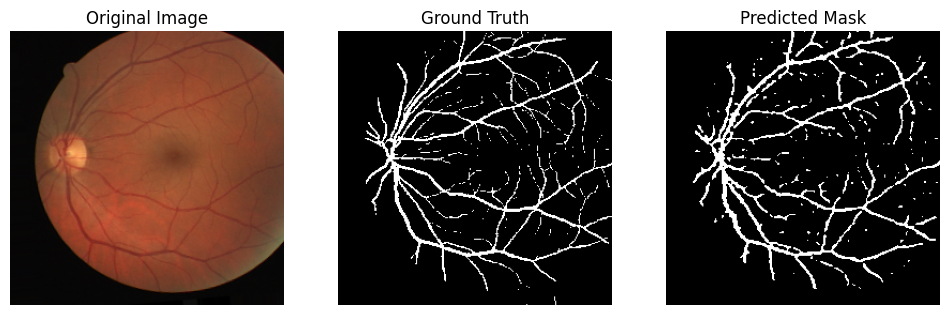

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


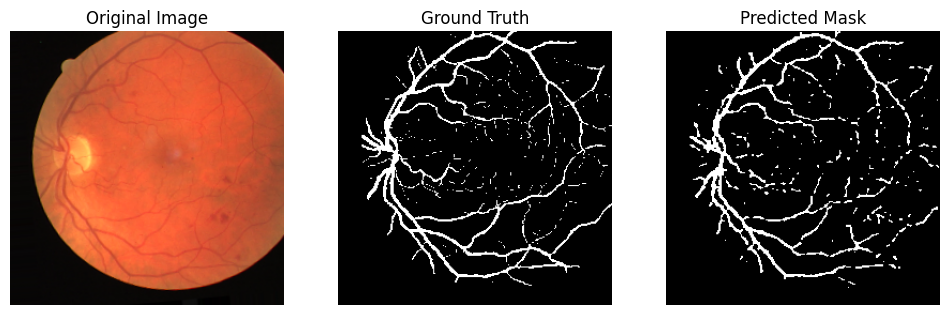

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


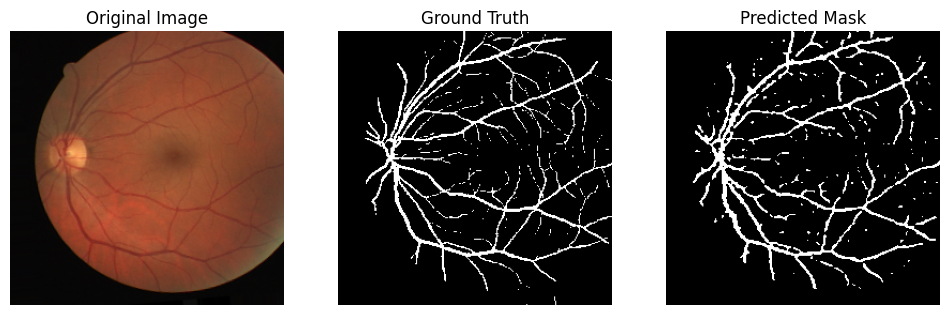

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


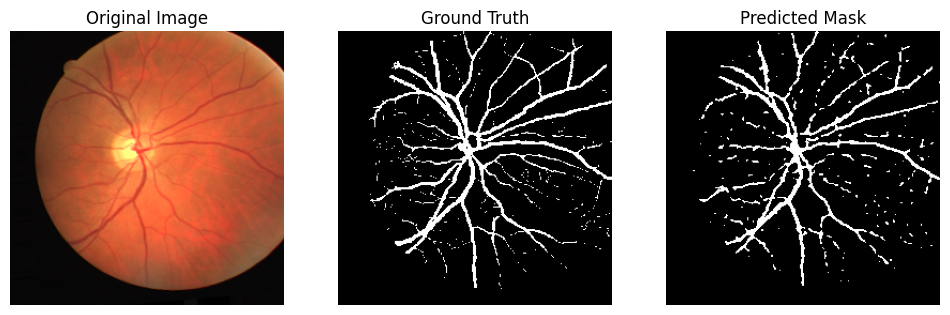

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


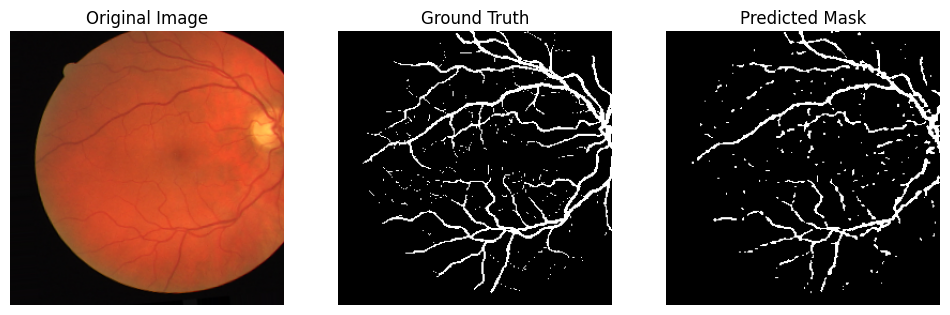

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


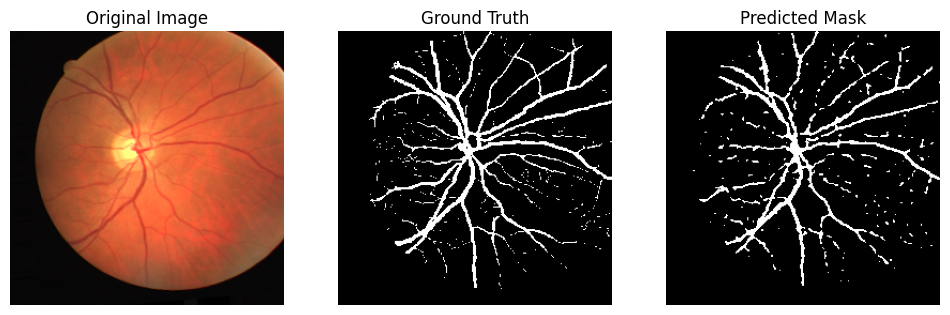

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


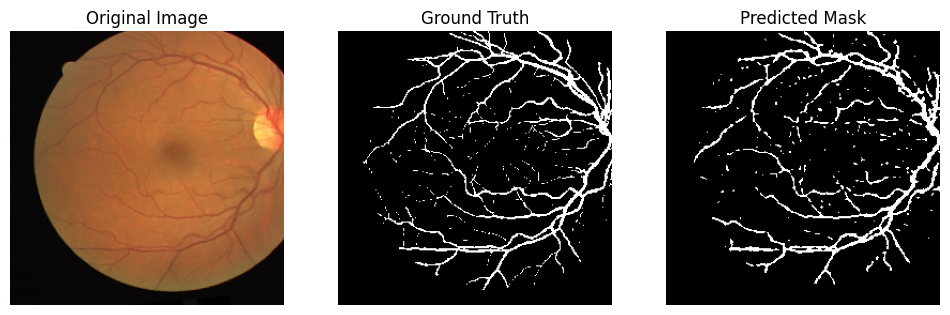

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


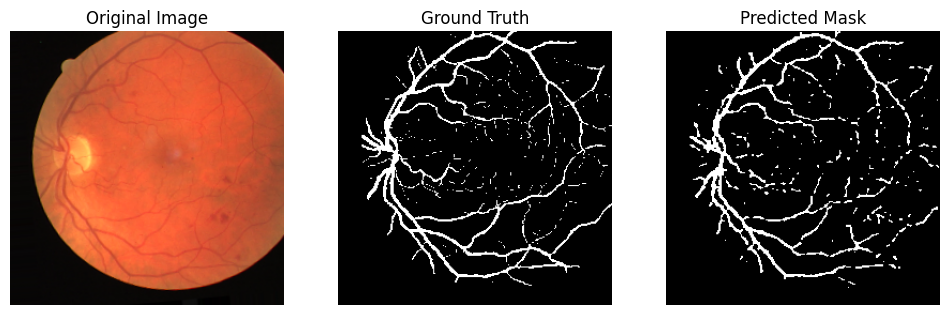

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


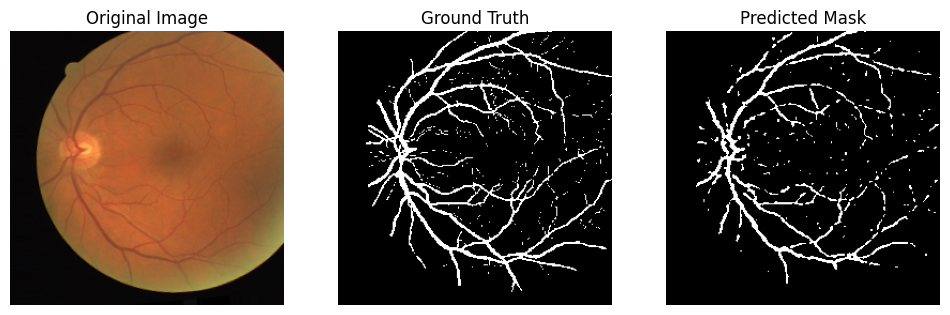

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


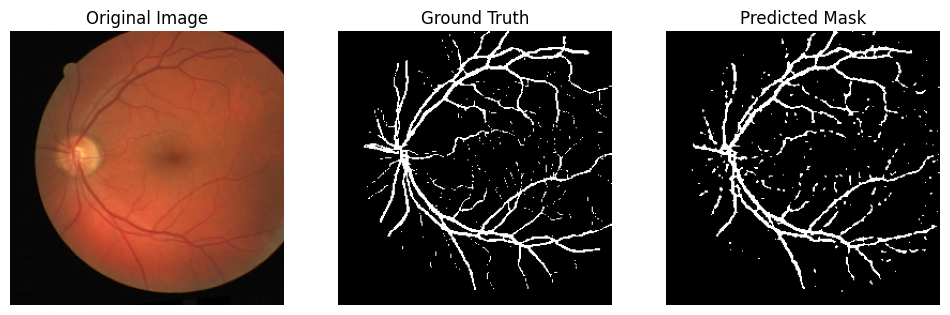

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


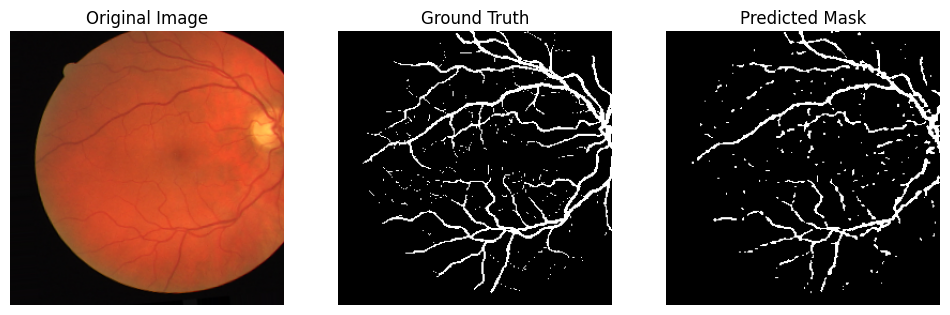

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


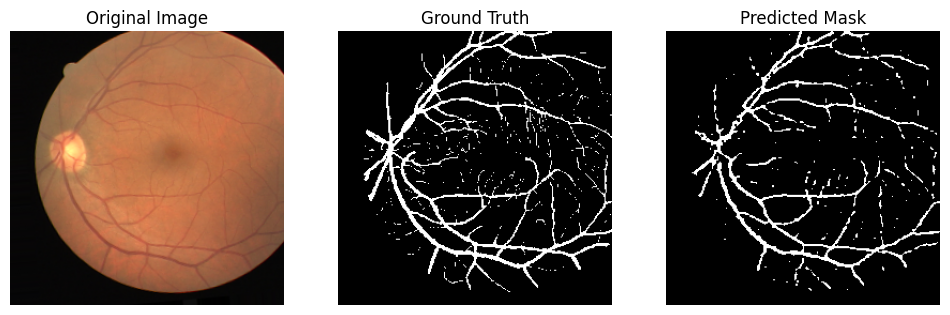

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


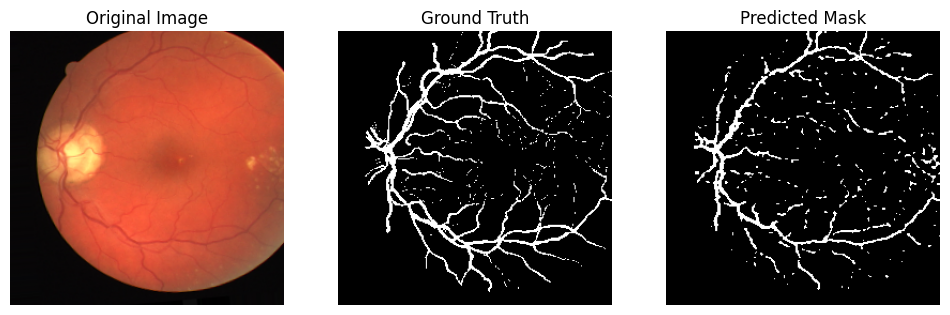

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


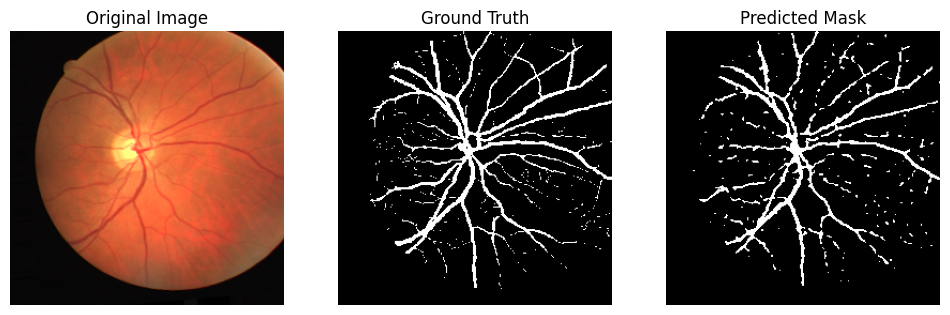

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


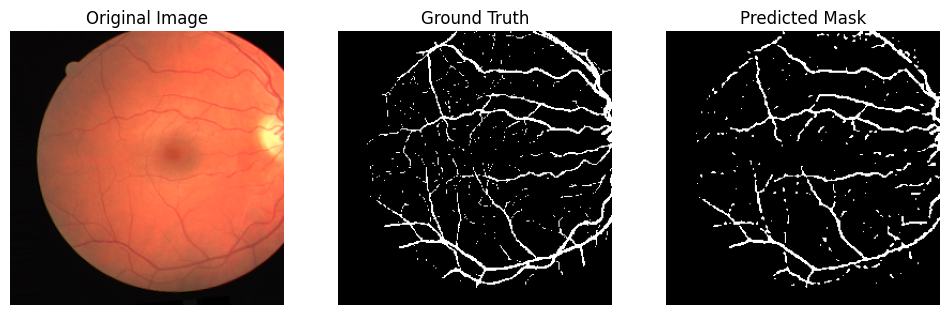

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


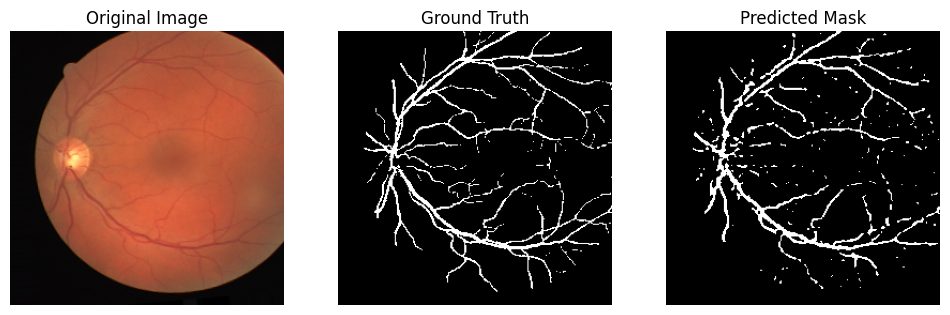

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


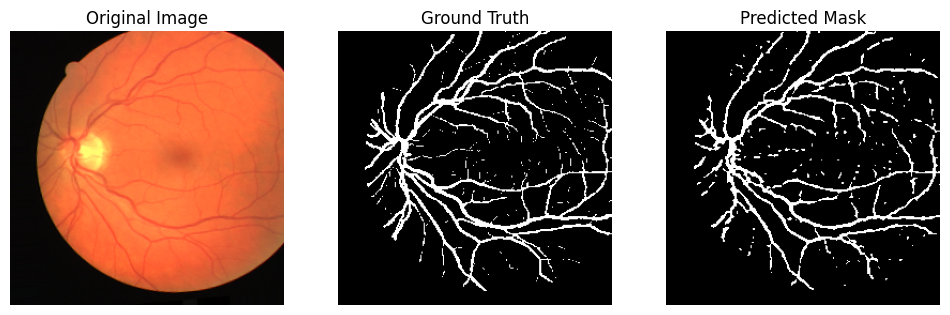

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


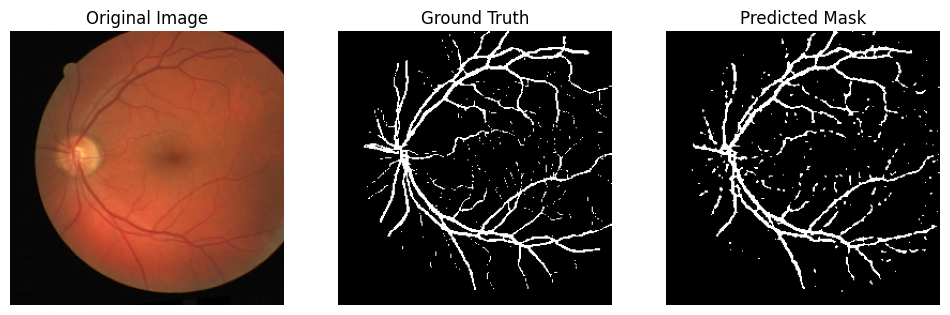

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


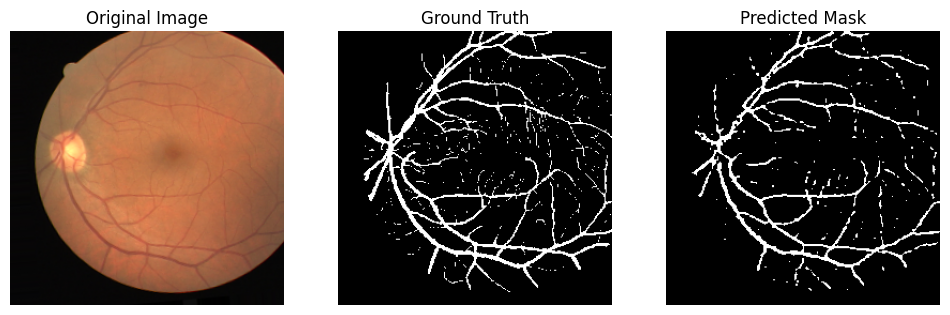

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


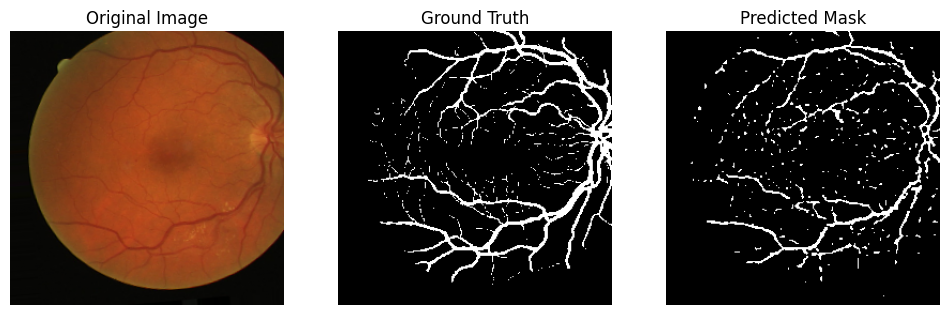

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


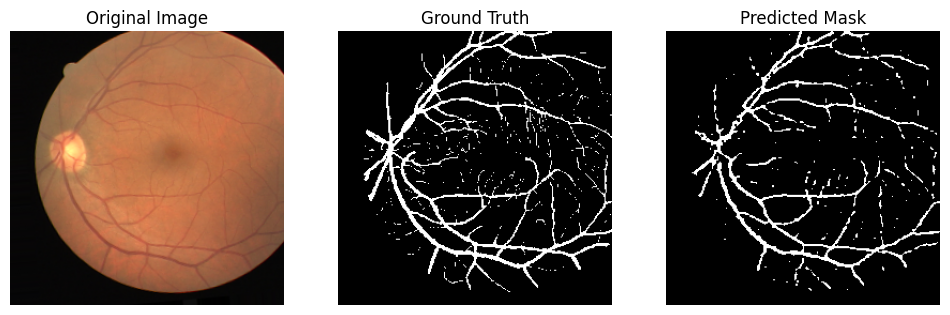

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


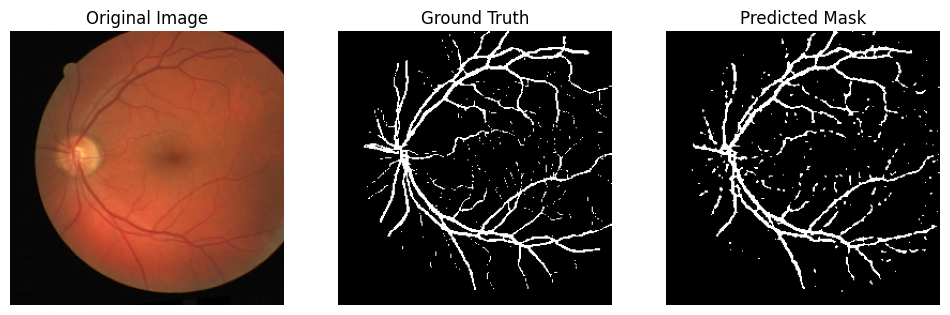

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


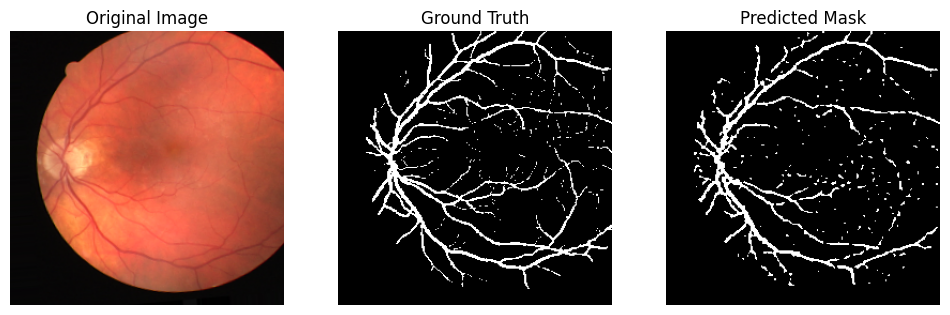

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


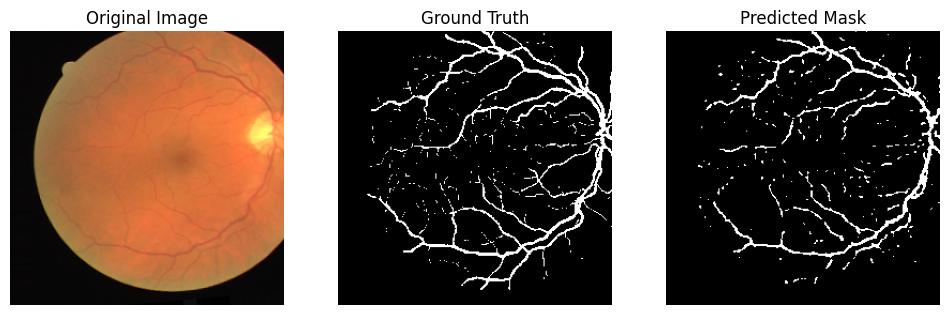

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


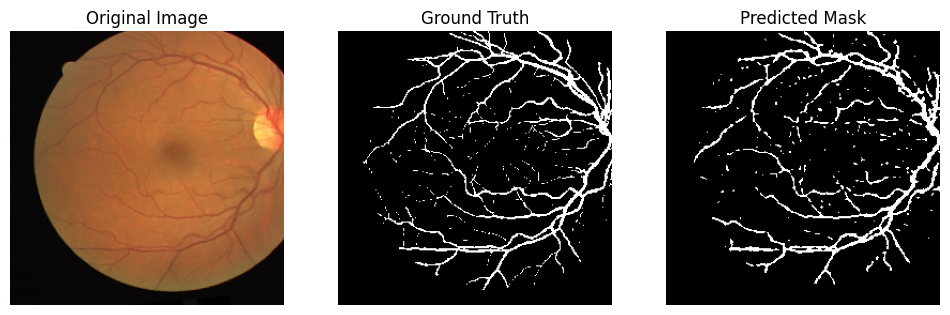

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


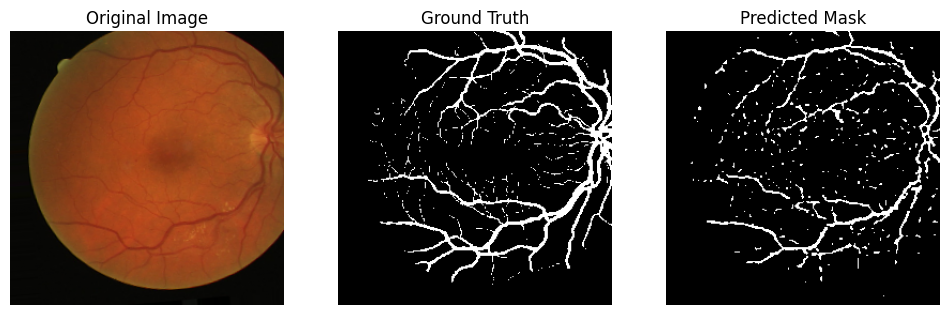

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


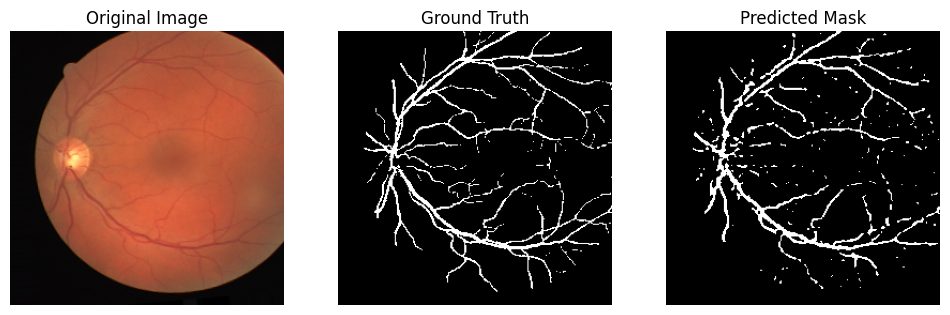

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


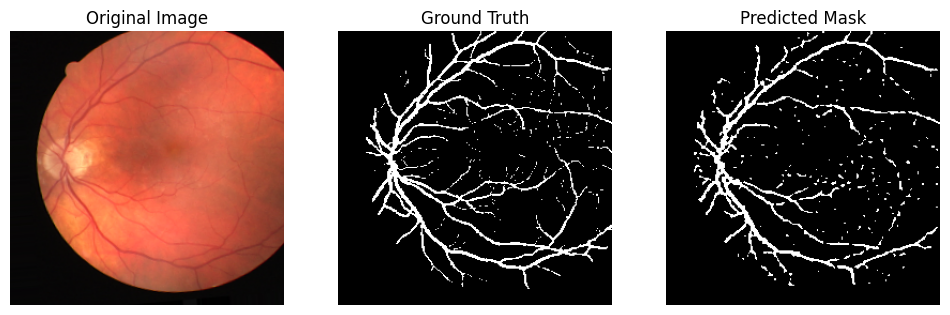

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


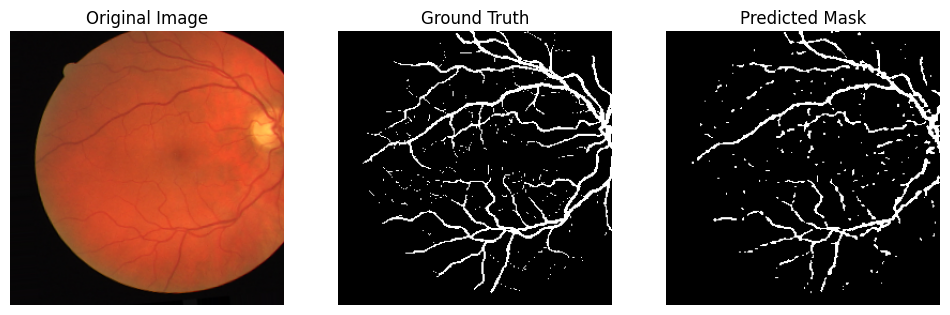

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


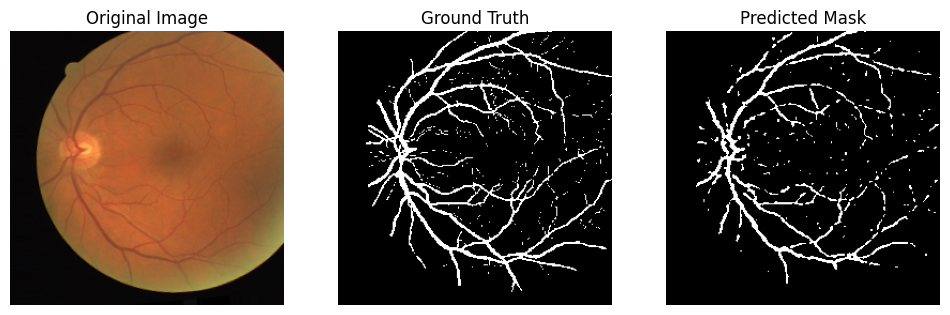

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


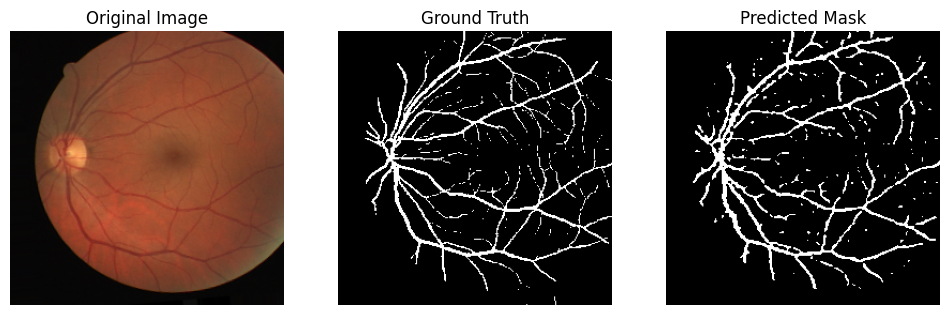

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


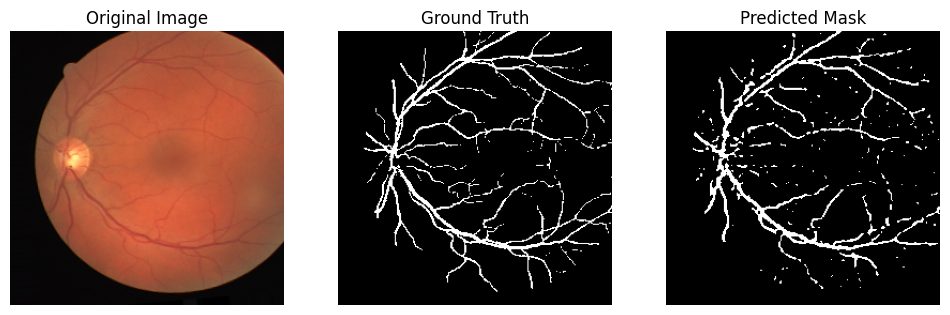

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


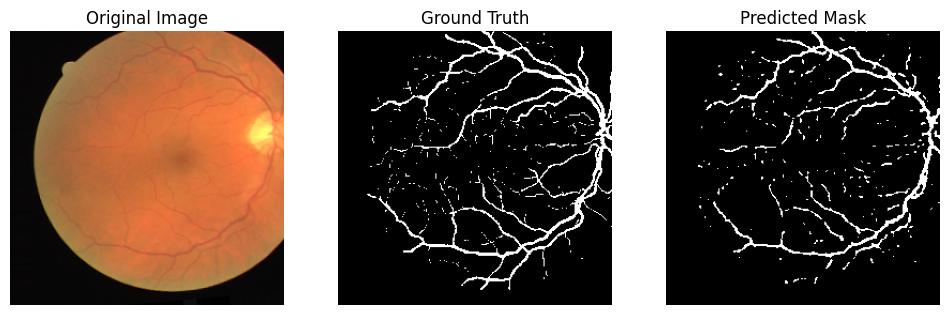

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


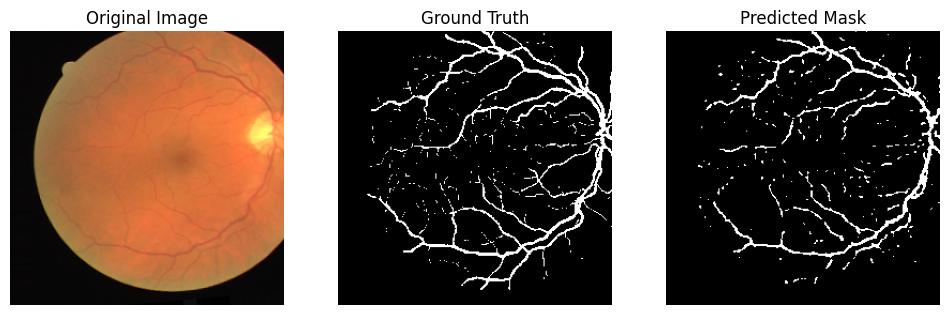

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


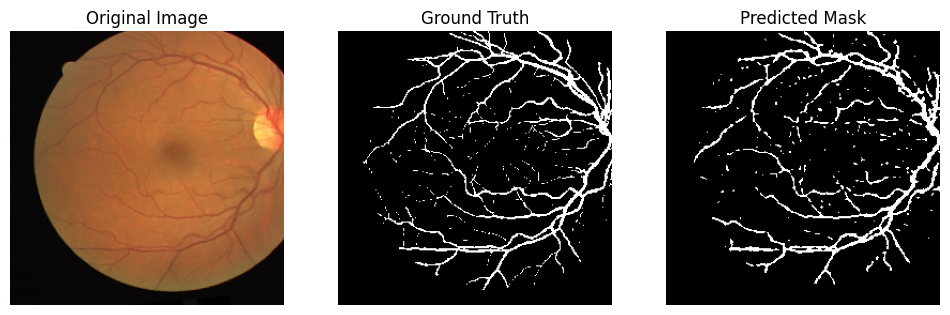

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


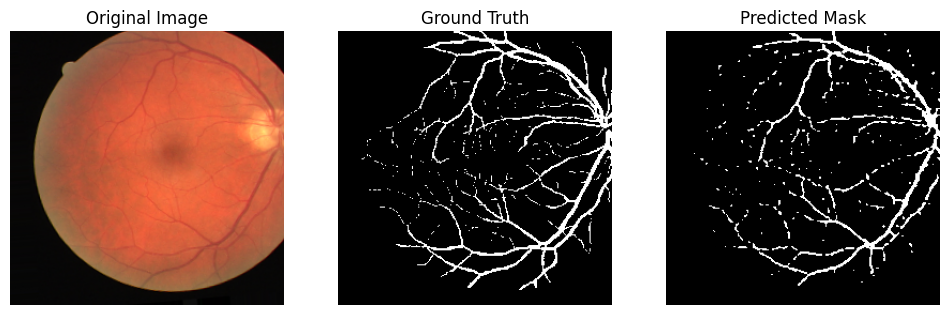

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


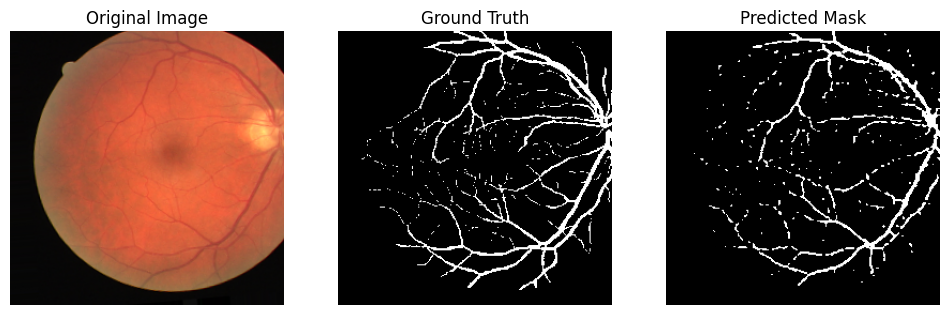

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


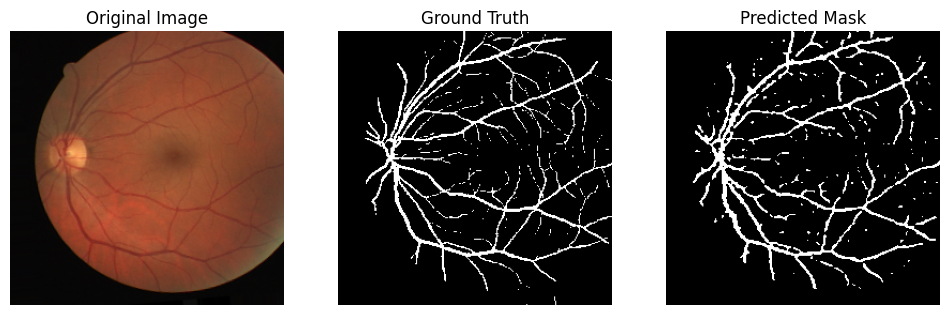

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


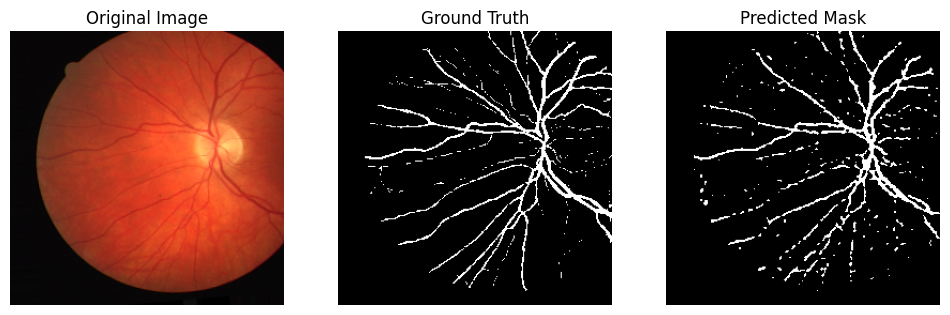

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


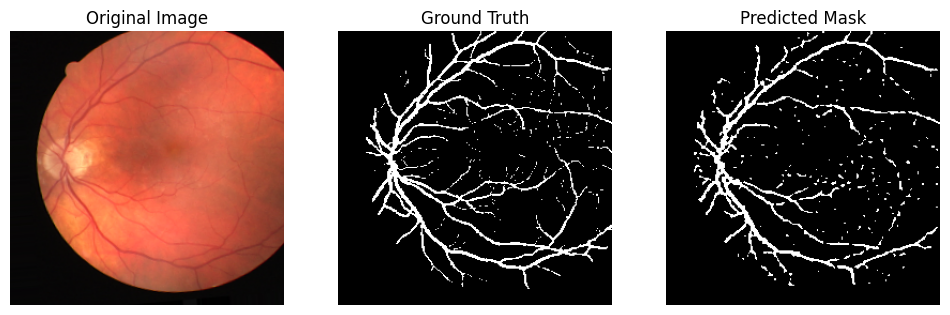

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


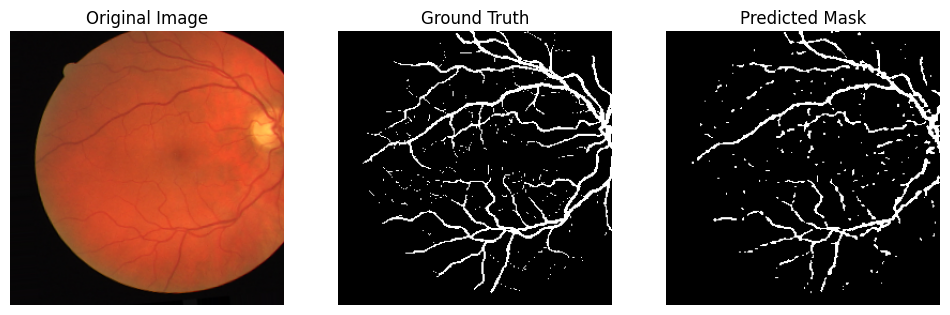

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


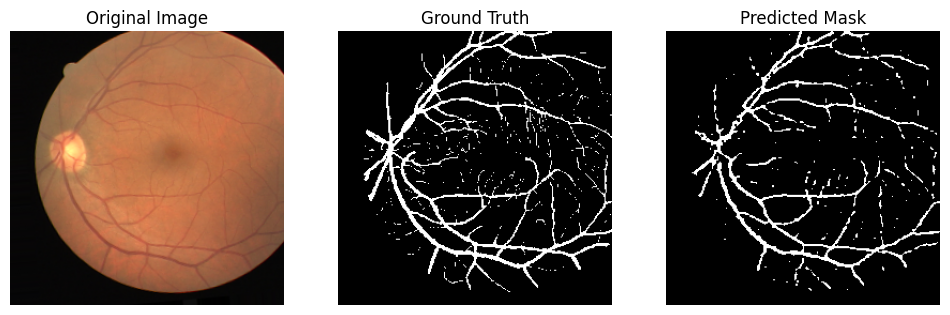

In [ ]:
for i in range(0,79):
  sample_image = test_images[i:i+1]
  prediction = model.predict(sample_image)[0]
  prediction = (prediction > 0.5).astype(np.uint8)
  visualize_prediction(test_images[i], test_masks[i], prediction)

Post-Processing and Evaluation
This cell demonstrates a basic image processing technique (opening) on a sample image and calculates the Mean IoU. You can modify this cell to apply morphological operations to the predicted mask and evaluate the improvement in Mean IoU.

- Calculating the mean IOU aafter post processing to see gain and assess if it improved as a result of post processing.

In [ ]:
from PIL import Image, ImageFilter
import numpy as np

import matplotlib.pyplot as plt
# Read the image
image = Image.open('/content/image 2.png')

# Handle RGBA images by converting them to RGB
if image.mode == 'RGBA':
    image = image.convert('RGB')

# Convert to grayscale
gray_image = image.convert('L')

# Convert to binary
binary_image = gray_image.point(lambda p: p > 127 and 255)

# Convert to NumPy array
binary_array = np.array(binary_image)



# Perform dilation
opened_array = Image.fromarray(binary_array).filter(ImageFilter.MaxFilter(3))
opened_image = np.array(opened_array)

# Perform erosion
eroded_array = Image.fromarray(binary_array).filter(ImageFilter.MinFilter(3))
eroded_array = np.array(eroded_array)



# Display the original and processed images using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Grayscale Image")
plt.imshow(gray_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Closed Image")
plt.imshow(opened_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


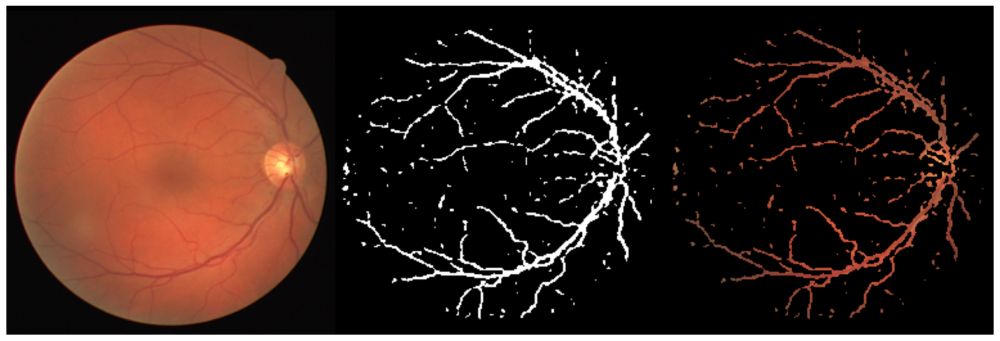

In [ ]:



raw = Image.open('/content/test_images/19.png')
raw = np.array(raw.resize((256, 256)))/255.
raw = raw[:,:,0:3]

#predict the mask
pred = model.predict(np.expand_dims(raw, 0))

#mask post-processing
msk  = pred.squeeze()
msk = np.stack((msk,)*3, axis=-1)
msk[msk >= 0.5] = 1
msk[msk < 0.5] = 0

plt.figure(figsize=(20,20))
#show the mask and the segmented image
combined = np.concatenate([raw, msk, raw* msk], axis = 1)
plt.axis('off')
plt.imshow(combined)
plt.show()

